#### Dependencies

In [1]:
from google.colab import drive
drive.mount("/content/drive")
import os
path_base="/content/drive/MyDrive/Capstone/"
path_LSTM ="/content/drive/MyDrive/Capstone/Model/BayesLSTM/"
os.chdir(path_base)
os.chdir(path_LSTM)

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/Capstone/Model/BayesLSTM
from Helpers import *
from LSTM_Helpers import *
from BayesLSTM_Helpers import *

/content


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
NumExpr defaulting to 2 threads.


#### Data

- use `rolling_statistics` as the imputation method

- if target data not up to 2021, use `InterpolatedUnivariateSpline` to interpolate

In [3]:
path="/content/drive/MyDrive/Capstone/Data/cleaned/"
os.chdir(path)
Data_dic_m = pd.ExcelFile('Manufacturing_filled.xlsx')
Data_dic_s = pd.ExcelFile('Service_filled.xlsx')

In [4]:
from scipy import interpolate

m_dfs = {}
for sheet in dic_country.keys():
    df = pd.read_excel(Data_dic_m, sheet_name=sheet)
    df['Year'] = [i.year for i in pd.to_datetime(df.Year, format='%Y')]
    df = df.set_index('Year')
    tmp_year = pd.DataFrame({'Year': [i for i in range(df.index[0], 2022)]})
    tmp_year['Year'] = [i.year for i in pd.to_datetime(tmp_year.Year, format='%Y')]
    df1 = df.join(tmp_year.set_index('Year'), on = 'Year', how = 'right')
    if 'Year' in df1.columns:
      df1 = df1.set_index('Year')
    tmp = {}
    for col in df.columns:
      s = interpolate.InterpolatedUnivariateSpline(x=df.index, y=df[col])
      ynew = s(df1.index)
      tmp[col] = ynew
    final_df = pd.DataFrame(tmp)
    final_df.index = df1.index
    m_dfs[sheet] = final_df

In [5]:
from scipy import interpolate

s_dfs = {}
for sheet in dic_country.keys():
    df = pd.read_excel(Data_dic_s, sheet_name=sheet)
    df['Year'] = [i.year for i in pd.to_datetime(df.Year, format='%Y')]
    df = df.set_index('Year')
    tmp_year = pd.DataFrame({'Year': [i for i in range(df.index[0], 2022)]})
    tmp_year['Year'] = [i.year for i in pd.to_datetime(tmp_year.Year, format='%Y')]
    df1 = df.join(tmp_year.set_index('Year'), on = 'Year', how = 'right')
    if 'Year' in df1.columns:
      df1 = df1.set_index('Year')
    tmp = {}
    for col in df.columns:
      s = interpolate.InterpolatedUnivariateSpline(x=df.index, y=df[col])
      ynew = s(df1.index)
      tmp[col] = ynew
    final_df = pd.DataFrame(tmp)
    final_df.index = df1.index
    s_dfs[sheet] = final_df

#### Pipeline

###### Hypers

In [6]:
SHIFT = 5
LW = 5
IW = 4
MAX_EPOCHS = 200
bs = 8
verbose = True
lr = 0.001
patience = 100

In [7]:
cmap = sns.color_palette('muted', 6).as_hex()[:]
cmap.append('#17becf')
sns.set_style("whitegrid")

In [8]:
cmap2_base = sns.color_palette('Blues_r', 6).as_hex()[:]
cmap2 = [cmap2_base[2], cmap2_base[3], cmap2_base[4], 'red']

###### Model blitz

In [9]:
 @variational_estimator
 class NN(nn.Module):
    def __init__(self, args):
        super().__init__()
        self.lstm_1 = blitz.modules.BayesianLSTM(args.n_features, 10, prior_sigma_1=args.prior_sigma_1, 
                                                 prior_pi=args.prior_pi1, posterior_rho_init=args.posterior_rho_init1)
        self.lstm_2 = blitz.modules.BayesianLSTM(10, 256, prior_sigma_1=args.prior_sigma_2, 
                                                 prior_pi=args.prior_pi2, posterior_rho_init=args.posterior_rho_init2)
        self.lstm_3 = blitz.modules.BayesianLSTM(256, 128, prior_sigma_1=args.prior_sigma_3, 
                                                 prior_pi=args.prior_pi3, posterior_rho_init=args.posterior_rho_init3)
        self.rnn_test = nn.RNN(128, 10, 2)
        self.linear = nn.Linear(10, 5)
            
    def forward(self, x):
        x_, x_1 = self.lstm_1(x)
        x_, x_2 = self.lstm_2(x_)
        x_, x_3 = self.lstm_3(x_)
        x_, x_4 = self.rnn_test(x_)
        
        #gathering only the latent end-of-sequence for the linear layer
        x_ = x_[:, -1, :]
        x_ = self.linear(x_)
        return x_

    def compute_loss(self, X_batch, y_batch, outputs):
      # nn.L1Loss()(y_hat, y.float())
      return self.sample_elbo(inputs=X_batch,
                           labels=y_batch.reshape(outputs.shape),
                           criterion=nn.L1Loss(),
                           sample_nbr=3)

In [10]:
# define an attribute dictionary class, used to save attributes
class AttrDict(dict):
    def __init__(self, *args, **kwargs):
        super(AttrDict, self).__init__(*args, **kwargs)
        self.__dict__ = self

###### Evaluate

In [11]:
def evaluate_regression(preds,
                        std_multiplier = 2):
    preds = np.stack(preds)
    means = preds.mean(axis=0)
    stds = preds.std(axis=0)
    ci_upper = means + (std_multiplier * stds)
    ci_lower = means - (std_multiplier * stds)
    return means, ci_upper, ci_lower

In [12]:
def fetch_all(model, wg, scaled_data,  args, samples=100):    
    losses = []    
    with torch.no_grad():
      X =  next(iter(wg.all_data))[0].numpy()
      y =  next(iter(wg.all_data))[1].numpy()
      if args.gpu: # if gpu
          X = torch.from_numpy(X).cuda() # convert data to gpu
          y = torch.from_numpy(y).cuda() # convert target to gpu
      preds = []
      for i in range(samples):
        y_pred = model(X.float())
        med, qrg = rbscaler.get_fitted()
        target_median, qrange = med.values[-1], qrg[-1]
        y_pred = y_pred.cpu().detach().numpy()*qrange+target_median
        y_real = np.array([y*qrange+target_median for y in y.cpu().detach().numpy()]).reshape(y_pred.shape)
        preds.append(y_pred)
      means, ci_upper, ci_lower = evaluate_regression(preds)
      df_1 = pd.DataFrame({
               'Year':  scaled_data.index[IW+LW-1:],
               'y_value': means[:, -1], 
               'y_lower_bound': ci_lower[:, -1], 
               'y_upper_bound': ci_upper[:, -1], 
               })
      ax = pd.DataFrame({'y_value': means[:, -1], 
                  'y_lower_bound': ci_lower[:, -1], 
               'y_upper_bound': ci_upper[:, -1], 
              'y_real': y_real[:, -1]
               },
              index =  scaled_data.index[IW+LW-1:]).plot(title = f'{ckey}: MAE = {round(MAE(means, y_real)[0][-1], 4)}', color = cmap2)
      ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}-CI', bbox_inches='tight')
      mae = str(MAE(means, y_real)[0][-1])
      rmse = str(RMSE(means, y_real)[0][-1])
      mape = str(MAPE(means, y_real)[0])
      preds = []
      for i in range(samples):
        df_2 = forecast(rbscaler, scaled_data, model, name = 'y_value',IW=4, args=args)
        y_pred = df_2.values
        preds.append(y_pred)
      means, ci_upper, ci_lower = evaluate_regression(preds)

      df_2 = pd.DataFrame({
               'Year':  df_2.index,
               'y_value': means[:, -1], 
               'y_lower_bound': ci_lower[:, -1], 
               'y_upper_bound': ci_upper[:, -1], 
               })
      return df_1, df_2, mae, rmse, mape

###### Write Data

In [13]:
def write_data():
  logs = {}
  logs['y_fitted_on_begin_2016'] = df_1[:-5]
  logs['y_pred_on_2017_2021'] = df_1[-5:]
  logs['y_fitted_on_begin_2021'] = df_3
  logs['y_pred_on_2022_2026'] = df_4
  with pd.ExcelWriter(path_LSTM + args.experiment_name  + "/result/" + f'{target_type}/{ckey}.xlsx') as writer:
    for log_type, log in logs.items():
      log.to_excel(writer, sheet_name=log_type, index = False)

### Model


##### 1-Manufacturing

In [14]:
target_type = 'Manufacturing'

###### Multivariate

In [15]:
model_type = 'Multivariate'

===== Training =====
Epoch [1/30], Train Loss: 730431.6458, Training Time (s): 0
Epoch [1/30], Val Loss: 719891.8750,  Validation time (s): 0
Epoch [2/30], Train Loss: 715796.3542, Training Time (s): 0
Epoch [2/30], Val Loss: 707525.9375,  Validation time (s): 0
Epoch [3/30], Train Loss: 703980.9583, Training Time (s): 0
Epoch [3/30], Val Loss: 697002.6250,  Validation time (s): 0
Epoch [4/30], Train Loss: 693921.0833, Training Time (s): 0
Epoch [4/30], Val Loss: 688288.0312,  Validation time (s): 0
Epoch [5/30], Train Loss: 685137.0000, Training Time (s): 0
Epoch [5/30], Val Loss: 679756.2500,  Validation time (s): 0
Epoch [6/30], Train Loss: 677670.6667, Training Time (s): 0
Epoch [6/30], Val Loss: 673180.6250,  Validation time (s): 0
Epoch [7/30], Train Loss: 670894.1458, Training Time (s): 0
Epoch [7/30], Val Loss: 666905.8125,  Validation time (s): 0
Epoch [8/30], Train Loss: 664791.5208, Training Time (s): 0
Epoch [8/30], Val Loss: 661453.1250,  Validation time (s): 0
Epoch [9/30

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.79792154, MAE2: 0.8861208
===== Training =====
Epoch [1/30], Train Loss: 725532.2000, Training Time (s): 1
Epoch [1/30], Val Loss: 711566.8438,  Validation time (s): 0
Epoch [2/30], Train Loss: 704030.4000, Training Time (s): 1
Epoch [2/30], Val Loss: 693584.3750,  Validation time (s): 0
Epoch [3/30], Train Loss: 688125.7000, Training Time (s): 1
Epoch [3/30], Val Loss: 679994.0312,  Validation time (s): 0
Epoch [4/30], Train Loss: 674923.8750, Training Time (s): 1
Epoch [4/30], Val Loss: 668620.6562,  Validation time (s): 0
Epoch [5/30], Train Loss: 664716.1625, Training Time (s): 1
Epoch [5/30], Val Loss: 659324.0312,  Validation time (s): 0
Epoch [6/30], Train Loss: 656349.2875, Training Time (s): 1
Epoch [6/30], Val Loss: 651867.8750,  Validation time (s): 0
Epoch [7/30], Train Loss: 649498.0500, Training Time (s): 1
Epoch [7/30], Val Loss: 645879.6562,  Validation time (s): 0
Epoch [8/30], Train Loss: 643937.5500, Training Time (s): 1
Epoch [8/30], Val Loss: 641257.7188,  

<ipython-input-92-589f562a40b3>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/30], Train Loss: 725794.2500, Training Time (s): 1
Epoch [1/30], Val Loss: 711746.5625,  Validation time (s): 0
Epoch [2/30], Train Loss: 704227.0250, Training Time (s): 1
Epoch [2/30], Val Loss: 693829.6875,  Validation time (s): 0
Epoch [3/30], Train Loss: 687967.9000, Training Time (s): 1
Epoch [3/30], Val Loss: 679581.0000,  Validation time (s): 0
Epoch [4/30], Train Loss: 675192.6125, Training Time (s): 1
Epoch [4/30], Val Loss: 668524.9375,  Validation time (s): 0
Epoch [5/30], Train Loss: 664776.5625, Training Time (s): 1
Epoch [5/30], Val Loss: 659241.0625,  Validation time (s): 0
Epoch [6/30], Train Loss: 656235.4375, Training Time (s): 1
Epoch [6/30], Val Loss: 651669.7188,  Validation time (s): 0
Epoch [7/30], Train Loss: 649442.0500, Training Time (s): 1
Epoch [7/30], Val Loss: 646119.2500,  Validation time (s): 0
Epoch [8/30], Train Loss: 644006.5125, Training Time (s): 1
Epoch [8/30], Val Loss: 640799.5000,  Validation time (s): 0
Epoch [9/30

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 2.5609586, MAE2: 2.5309575
===== Training =====
Epoch [1/30], Train Loss: 733211.4062, Training Time (s): 0
Epoch [1/30], Val Loss: 725049.6875,  Validation time (s): 0
Epoch [2/30], Train Loss: 722724.1875, Training Time (s): 0
Epoch [2/30], Val Loss: 715898.9375,  Validation time (s): 0
Epoch [3/30], Train Loss: 713537.6250, Training Time (s): 0
Epoch [3/30], Val Loss: 707731.6875,  Validation time (s): 0
Epoch [4/30], Train Loss: 705544.9688, Training Time (s): 0
Epoch [4/30], Val Loss: 700855.9375,  Validation time (s): 0
Epoch [5/30], Train Loss: 698533.9375, Training Time (s): 0
Epoch [5/30], Val Loss: 693417.5000,  Validation time (s): 0
Epoch [6/30], Train Loss: 692639.2500, Training Time (s): 0
Epoch [6/30], Val Loss: 687991.4375,  Validation time (s): 0
Epoch [7/30], Train Loss: 686534.8125, Training Time (s): 0
Epoch [7/30], Val Loss: 682159.7500,  Validation time (s): 0
Epoch [8/30], Train Loss: 681031.4062, Training Time (s): 0
Epoch [8/30], Val Loss: 677284.7500,  V

<ipython-input-92-589f562a40b3>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/30], Train Loss: 733013.8438, Training Time (s): 0
Epoch [1/30], Val Loss: 725282.5000,  Validation time (s): 0
Epoch [2/30], Train Loss: 723079.7500, Training Time (s): 0
Epoch [2/30], Val Loss: 715973.1250,  Validation time (s): 0
Epoch [3/30], Train Loss: 713819.6875, Training Time (s): 0
Epoch [3/30], Val Loss: 707363.3750,  Validation time (s): 0
Epoch [4/30], Train Loss: 705874.9062, Training Time (s): 0
Epoch [4/30], Val Loss: 700374.1875,  Validation time (s): 0
Epoch [5/30], Train Loss: 698877.4375, Training Time (s): 0
Epoch [5/30], Val Loss: 694475.3750,  Validation time (s): 0
Epoch [6/30], Train Loss: 692323.3438, Training Time (s): 0
Epoch [6/30], Val Loss: 687715.5000,  Validation time (s): 0
Epoch [7/30], Train Loss: 686760.5000, Training Time (s): 0
Epoch [7/30], Val Loss: 682276.5625,  Validation time (s): 0
Epoch [8/30], Train Loss: 681433.0000, Training Time (s): 0
Epoch [8/30], Val Loss: 677577.5000,  Validation time (s): 0
Epoch [9/30

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.37227046, MAE2: 0.3096707


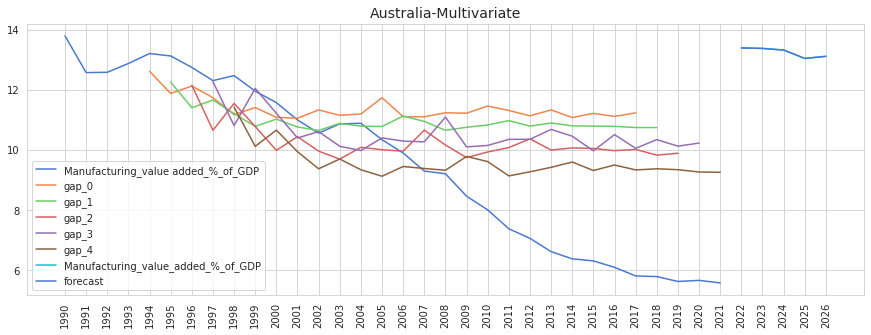

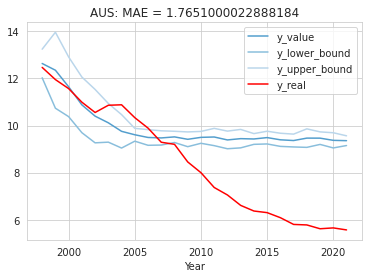

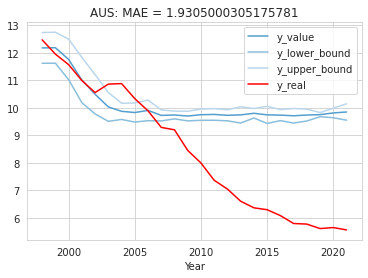

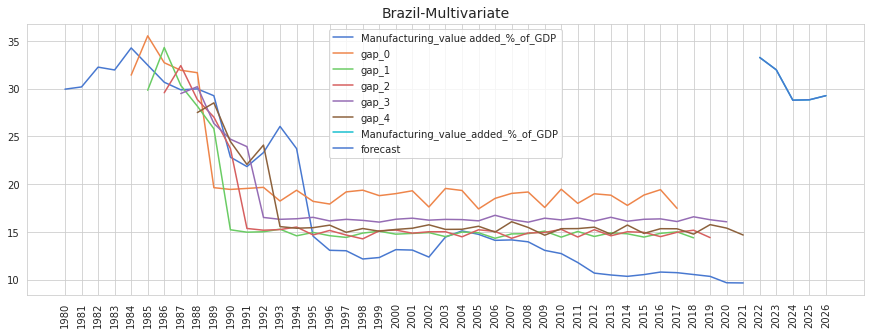

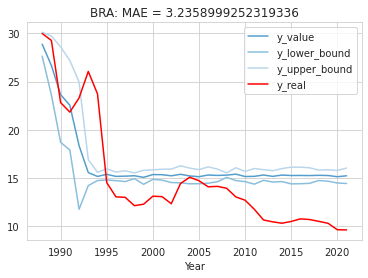

...

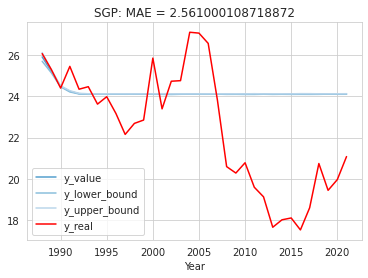

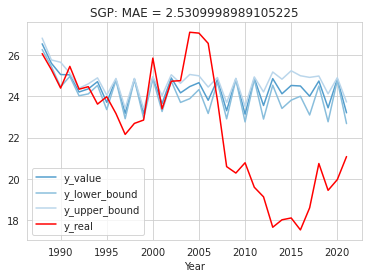

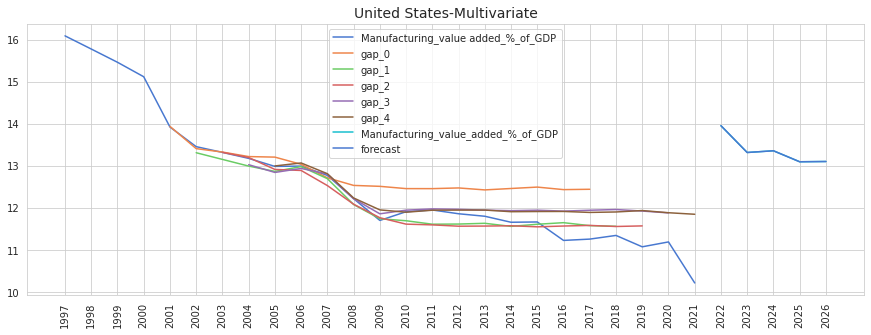

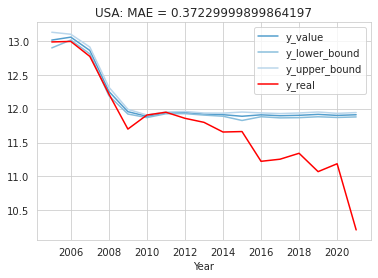

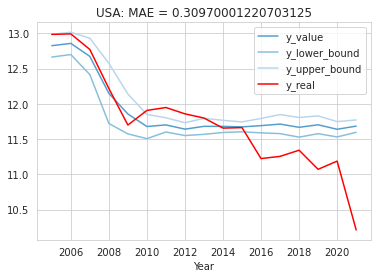

In [92]:
MAEs, RMSEs, MAPEs = [], [], []

for ckey in m_dfs.keys():
  country = dic_country[ckey]
  data = m_dfs[ckey]
  rbscaler = MRobustScaler() 
  scaled_data = rbscaler.transform(data, 0.1)
  train_df, val_df, test_df=train_test_split(scaled_data, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.05,
      "batch_size": 5,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.3,
      "epochs": 30,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)

  fcst = forecast(rbscaler, scaled_data, model, args, IW=IW, name = 'Manufacturing_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Manufacturing_value_added_%_of_GDP']
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

###### Univariate

In [93]:
model_type = 'Univariate'

===== Training =====
Epoch [1/8], Train Loss: 735386.0312, Training Time (s): 0
Epoch [1/8], Val Loss: 735314.4375,  Validation time (s): 0
Epoch [2/8], Train Loss: 734918.9688, Training Time (s): 0
Epoch [2/8], Val Loss: 734904.3750,  Validation time (s): 0
Epoch [3/8], Train Loss: 735028.0312, Training Time (s): 0
Epoch [3/8], Val Loss: 734974.5000,  Validation time (s): 0
Epoch [4/8], Train Loss: 735128.6875, Training Time (s): 0
Epoch [4/8], Val Loss: 734875.7500,  Validation time (s): 0
Epoch [5/8], Train Loss: 734813.9688, Training Time (s): 0
Epoch [5/8], Val Loss: 734754.3750,  Validation time (s): 0
Epoch [6/8], Train Loss: 734798.6875, Training Time (s): 0
Epoch [6/8], Val Loss: 734628.5000,  Validation time (s): 0
Epoch [7/8], Train Loss: 734754.1562, Training Time (s): 0
Epoch [7/8], Val Loss: 734723.9375,  Validation time (s): 0
Epoch [8/8], Train Loss: 734275.9375, Training Time (s): 0
Epoch [8/8], Val Loss: 734893.0000,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.7449198, MAE2: 0.71255064
===== Training =====
Epoch [1/8], Train Loss: 735104.4167, Training Time (s): 0
Epoch [1/8], Val Loss: 735107.8125,  Validation time (s): 0
Epoch [2/8], Train Loss: 735456.8542, Training Time (s): 0
Epoch [2/8], Val Loss: 735049.9062,  Validation time (s): 0
Epoch [3/8], Train Loss: 735199.5625, Training Time (s): 0
Epoch [3/8], Val Loss: 734925.3125,  Validation time (s): 0
Epoch [4/8], Train Loss: 735258.1250, Training Time (s): 0
Epoch [4/8], Val Loss: 734728.5625,  Validation time (s): 0
Epoch [5/8], Train Loss: 734541.3958, Training Time (s): 0
Epoch [5/8], Val Loss: 734703.6250,  Validation time (s): 0
Epoch [6/8], Train Loss: 734497.8542, Training Time (s): 0
Epoch [6/8], Val Loss: 734763.9375,  Validation time (s): 0
Epoch [7/8], Train Loss: 734737.8750, Training Time (s): 0
Epoch [7/8], Val Loss: 735018.6250,  Validation time (s): 0
Epoch [8/8], Train Loss: 734702.4792, Training Time (s): 0
Epoch [8/8], Val Loss: 734560.0938,  Validation time 

<ipython-input-94-35d5ab4a65f4>:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735064.6042, Training Time (s): 0
Epoch [1/8], Val Loss: 735061.3125,  Validation time (s): 0
Epoch [2/8], Train Loss: 735380.4583, Training Time (s): 0
Epoch [2/8], Val Loss: 735151.2812,  Validation time (s): 0
Epoch [3/8], Train Loss: 735005.6250, Training Time (s): 0
Epoch [3/8], Val Loss: 735137.0625,  Validation time (s): 0
Epoch [4/8], Train Loss: 735114.6875, Training Time (s): 0
Epoch [4/8], Val Loss: 734581.5625,  Validation time (s): 0
Epoch [5/8], Train Loss: 734604.7292, Training Time (s): 0
Epoch [5/8], Val Loss: 734762.0625,  Validation time (s): 0
Epoch [6/8], Train Loss: 734296.1458, Training Time (s): 0
Epoch [6/8], Val Loss: 734458.9688,  Validation time (s): 0
Epoch [7/8], Train Loss: 734361.1875, Training Time (s): 0
Epoch [7/8], Val Loss: 734828.8438,  Validation time (s): 0
Epoch [8/8], Train Loss: 734403.2083, Training Time (s): 0
Epoch [8/8], Val Loss: 734225.1875,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 2.6284802, MAE2: 2.5293193
===== Training =====
Epoch [1/8], Train Loss: 735524.6875, Training Time (s): 0
Epoch [1/8], Val Loss: 734698.5000,  Validation time (s): 0
Epoch [2/8], Train Loss: 735431.0000, Training Time (s): 0
Epoch [2/8], Val Loss: 735060.1875,  Validation time (s): 0
Epoch [3/8], Train Loss: 734962.6250, Training Time (s): 0
Epoch [3/8], Val Loss: 734708.3750,  Validation time (s): 0
Epoch [4/8], Train Loss: 734942.8750, Training Time (s): 0
Epoch [4/8], Val Loss: 735307.5000,  Validation time (s): 0
Epoch [5/8], Train Loss: 735563.6875, Training Time (s): 0
Epoch [5/8], Val Loss: 735029.3750,  Validation time (s): 0
Epoch [6/8], Train Loss: 735524.6875, Training Time (s): 0
Epoch [6/8], Val Loss: 735247.1875,  Validation time (s): 0
Epoch [7/8], Train Loss: 735163.4375, Training Time (s): 0
Epoch [7/8], Val Loss: 734636.6875,  Validation time (s): 0
Epoch [8/8], Train Loss: 735368.6250, Training Time (s): 0
Epoch [8/8], Val Loss: 734696.1875,  Validation time (

<ipython-input-94-35d5ab4a65f4>:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735287.3750, Training Time (s): 0
Epoch [1/8], Val Loss: 735181.1250,  Validation time (s): 0
Epoch [2/8], Train Loss: 735143.7500, Training Time (s): 0
Epoch [2/8], Val Loss: 735352.9375,  Validation time (s): 0
Epoch [3/8], Train Loss: 734653.1875, Training Time (s): 0
Epoch [3/8], Val Loss: 735003.6250,  Validation time (s): 0
Epoch [4/8], Train Loss: 734846.3750, Training Time (s): 0
Epoch [4/8], Val Loss: 735093.5000,  Validation time (s): 0
Epoch [5/8], Train Loss: 734992.0000, Training Time (s): 0
Epoch [5/8], Val Loss: 735150.7500,  Validation time (s): 0
Epoch [6/8], Train Loss: 735186.3750, Training Time (s): 0
Epoch [6/8], Val Loss: 734971.2500,  Validation time (s): 0
Epoch [7/8], Train Loss: 735047.3750, Training Time (s): 0
Epoch [7/8], Val Loss: 735096.3750,  Validation time (s): 0
Epoch [8/8], Train Loss: 734870.6875, Training Time (s): 0
Epoch [8/8], Val Loss: 734619.1875,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.57259244, MAE2: 0.92109734


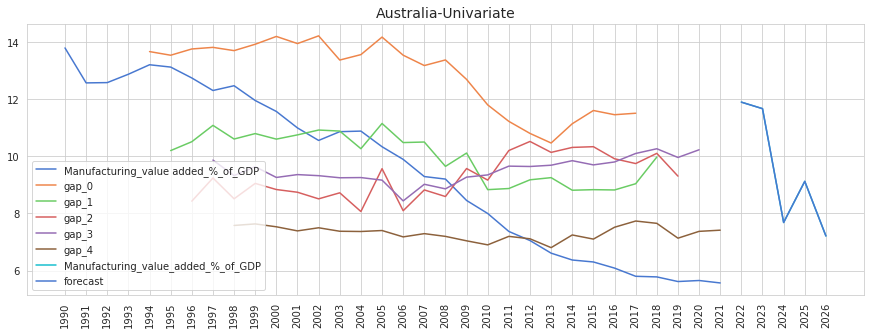

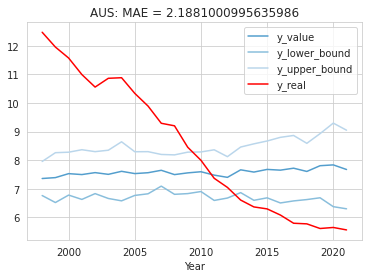

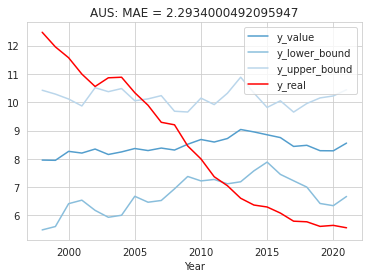

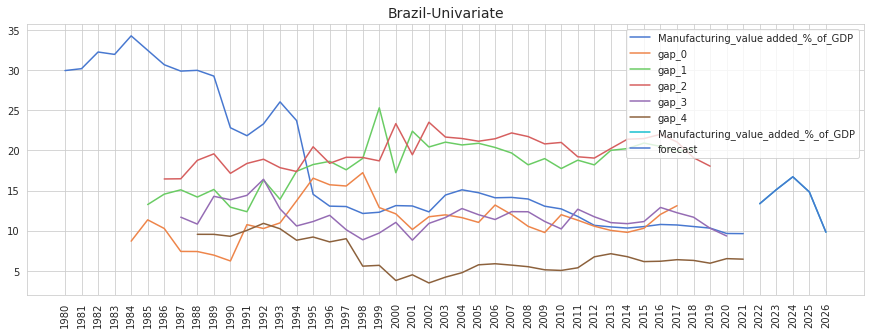

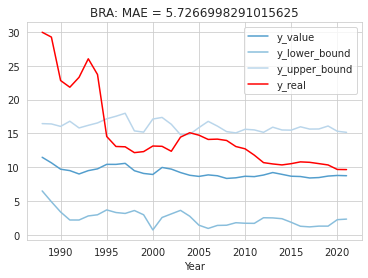

...

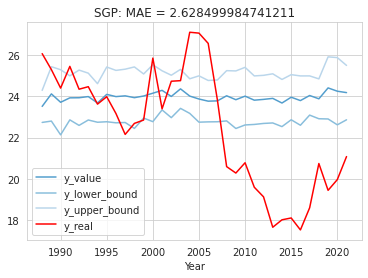

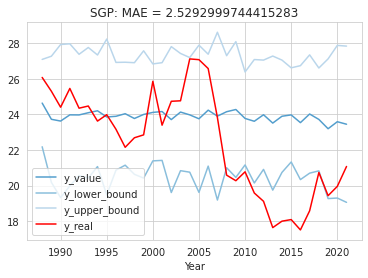

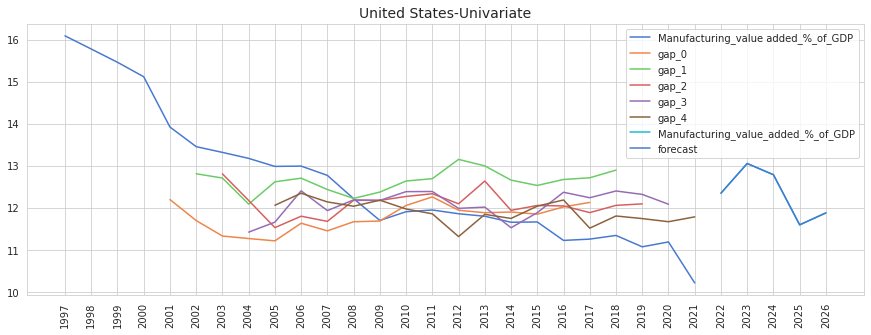

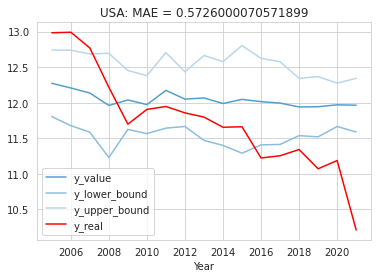

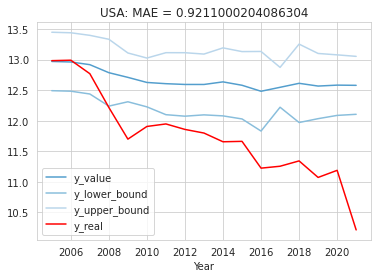

In [94]:
for ckey in m_dfs.keys():
  country = dic_country[ckey]
  data = m_dfs[ckey]
  data = data[['Manufacturing_value added_%_of_GDP']]
  rbscaler = MRobustScaler() 
  scaled_data = rbscaler.transform(data, 0.1)
  train_df, val_df, test_df=train_test_split(scaled_data, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 20,
      "dropout_probability": 0.3,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)

  fcst = forecast(rbscaler, scaled_data, model, args, IW=IW, name = 'Manufacturing_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Manufacturing_value_added_%_of_GDP']
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

In [95]:
rst_path = path_LSTM + args.experiment_name  + "/result/"
rst0 = pd.DataFrame({
  'Country': [dic_country[c] for c in m_dfs.keys()]*2,
  'Type': ['Multivariate'] * 9 + ['Univariate'] * 9,
  'MAE': MAEs,
  'RMSE': RMSEs,
  'MAPE':MAPEs
              }).sort_values('Country').set_index('Country')
rst0.to_csv(path_LSTM + f'{target_type}_result.csv')

In [96]:
rst0

,Type,MAE,RMSE,MAPE
Country,,,,
Australia,Multivariate,1.9305273,2.5070193,0.24026306
Australia,Univariate,2.293414,2.5046408,0.24878643
Brazil,Multivariate,2.201898,2.9090362,0.14322026
Brazil,Univariate,3.8273172,6.278444,0.36798713
Canada,Multivariate,0.6024639,1.1603649,0.11080629
Canada,Univariate,1.1124789,1.5282738,0.20991649
China,Multivariate,2.3273816,2.8026297,0.048869897
China,Univariate,3.6230118,3.950565,0.04072363
India,Multivariate,0.75837004,1.0105689,0.03128423


##### 2-Service

In [97]:
SHIFT = 5
LW = 5
IW = 4
MAX_EPOCHS = 200
bs = 8
verbose = True
lr = 0.001
patience = 100

In [98]:
target_type = 'Service'

###### Multivariate

In [99]:
model_type = 'Multivariate'

===== Training =====
Epoch [1/8], Train Loss: 735697.1875, Training Time (s): 0
Epoch [1/8], Val Loss: 736079.8750,  Validation time (s): 0
Epoch [2/8], Train Loss: 735711.2188, Training Time (s): 0
Epoch [2/8], Val Loss: 735068.5000,  Validation time (s): 0
Epoch [3/8], Train Loss: 735417.8750, Training Time (s): 0
Epoch [3/8], Val Loss: 735370.3750,  Validation time (s): 0
Epoch [4/8], Train Loss: 735485.3125, Training Time (s): 0
Epoch [4/8], Val Loss: 735844.1875,  Validation time (s): 0
Epoch [5/8], Train Loss: 735127.3438, Training Time (s): 0
Epoch [5/8], Val Loss: 735613.0000,  Validation time (s): 0
Epoch [6/8], Train Loss: 735236.6562, Training Time (s): 0
Epoch [6/8], Val Loss: 735403.6250,  Validation time (s): 0
Epoch [7/8], Train Loss: 735230.0000, Training Time (s): 0
Epoch [7/8], Val Loss: 735039.1875,  Validation time (s): 0
Epoch [8/8], Train Loss: 735110.8438, Training Time (s): 0
Epoch [8/8], Val Loss: 735512.6250,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.8978607, MAE2: 1.4502327
===== Training =====
Epoch [1/8], Train Loss: 735838.1250, Training Time (s): 0
Epoch [1/8], Val Loss: 735577.6250,  Validation time (s): 0
Epoch [2/8], Train Loss: 735520.1458, Training Time (s): 0
Epoch [2/8], Val Loss: 735635.3750,  Validation time (s): 0
Epoch [3/8], Train Loss: 735229.8542, Training Time (s): 0
Epoch [3/8], Val Loss: 735562.9688,  Validation time (s): 0
Epoch [4/8], Train Loss: 735370.7292, Training Time (s): 0
Epoch [4/8], Val Loss: 735403.3750,  Validation time (s): 0
Epoch [5/8], Train Loss: 735313.5625, Training Time (s): 0
Epoch [5/8], Val Loss: 735389.4375,  Validation time (s): 0
Epoch [6/8], Train Loss: 735157.0625, Training Time (s): 0
Epoch [6/8], Val Loss: 735491.3125,  Validation time (s): 0
Epoch [7/8], Train Loss: 735085.6042, Training Time (s): 0
Epoch [7/8], Val Loss: 734900.3750,  Validation time (s): 0
Epoch [8/8], Train Loss: 734801.8750, Training Time (s): 0
Epoch [8/8], Val Loss: 734821.3438,  Validation time (

<ipython-input-100-b28c45bd995d>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735759.0000, Training Time (s): 0
Epoch [1/8], Val Loss: 735758.4375,  Validation time (s): 0
Epoch [2/8], Train Loss: 735833.6250, Training Time (s): 0
Epoch [2/8], Val Loss: 735615.2188,  Validation time (s): 0
Epoch [3/8], Train Loss: 735528.5833, Training Time (s): 0
Epoch [3/8], Val Loss: 735188.4375,  Validation time (s): 0
Epoch [4/8], Train Loss: 735534.4167, Training Time (s): 0
Epoch [4/8], Val Loss: 735373.7500,  Validation time (s): 0
Epoch [5/8], Train Loss: 735608.1458, Training Time (s): 0
Epoch [5/8], Val Loss: 735285.8438,  Validation time (s): 0
Epoch [6/8], Train Loss: 735149.2083, Training Time (s): 0
Epoch [6/8], Val Loss: 735342.9688,  Validation time (s): 0
Epoch [7/8], Train Loss: 734959.3750, Training Time (s): 0
Epoch [7/8], Val Loss: 735423.2188,  Validation time (s): 0
Epoch [8/8], Train Loss: 735141.5625, Training Time (s): 0
Epoch [8/8], Val Loss: 735093.1562,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 3.2551925, MAE2: 3.4362736
===== Training =====
Epoch [1/8], Train Loss: 735746.1250, Training Time (s): 0
Epoch [1/8], Val Loss: 735848.6875,  Validation time (s): 0
Epoch [2/8], Train Loss: 735975.6875, Training Time (s): 0
Epoch [2/8], Val Loss: 736003.6250,  Validation time (s): 0
Epoch [3/8], Train Loss: 735859.6875, Training Time (s): 0
Epoch [3/8], Val Loss: 735860.4375,  Validation time (s): 0
Epoch [4/8], Train Loss: 736106.8750, Training Time (s): 0
Epoch [4/8], Val Loss: 735217.8750,  Validation time (s): 0
Epoch [5/8], Train Loss: 735599.8750, Training Time (s): 0
Epoch [5/8], Val Loss: 736157.0000,  Validation time (s): 0
Epoch [6/8], Train Loss: 735450.6875, Training Time (s): 0
Epoch [6/8], Val Loss: 734990.0000,  Validation time (s): 0
Epoch [7/8], Train Loss: 735033.6250, Training Time (s): 0
Epoch [7/8], Val Loss: 736142.5000,  Validation time (s): 0
Epoch [8/8], Train Loss: 735519.9375, Training Time (s): 0
Epoch [8/8], Val Loss: 735583.1875,  Validation time (

<ipython-input-100-b28c45bd995d>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735884.5000, Training Time (s): 0
Epoch [1/8], Val Loss: 735610.6250,  Validation time (s): 0
Epoch [2/8], Train Loss: 735993.6875, Training Time (s): 0
Epoch [2/8], Val Loss: 735970.3750,  Validation time (s): 0
Epoch [3/8], Train Loss: 735762.9375, Training Time (s): 0
Epoch [3/8], Val Loss: 736096.1875,  Validation time (s): 0
Epoch [4/8], Train Loss: 735942.6875, Training Time (s): 0
Epoch [4/8], Val Loss: 735533.4375,  Validation time (s): 0
Epoch [5/8], Train Loss: 735550.1875, Training Time (s): 0
Epoch [5/8], Val Loss: 735371.3750,  Validation time (s): 0
Epoch [6/8], Train Loss: 736025.2500, Training Time (s): 0
Epoch [6/8], Val Loss: 735167.1250,  Validation time (s): 0
Epoch [7/8], Train Loss: 735902.8750, Training Time (s): 0
Epoch [7/8], Val Loss: 735505.0000,  Validation time (s): 0
Epoch [8/8], Train Loss: 735438.6875, Training Time (s): 0
Epoch [8/8], Val Loss: 736123.0000,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.8057165, MAE2: 1.2383181


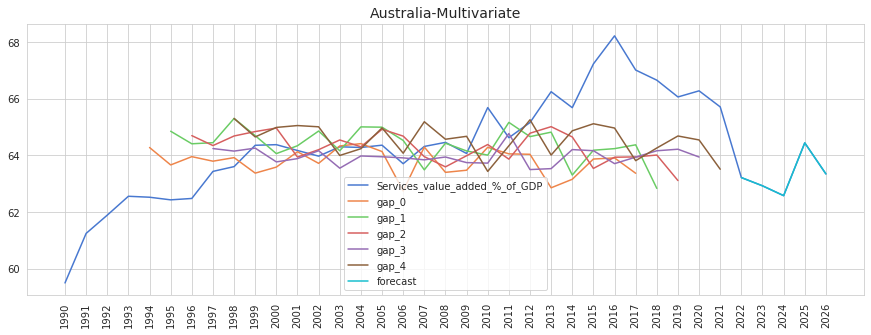

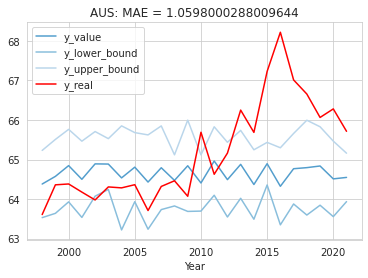

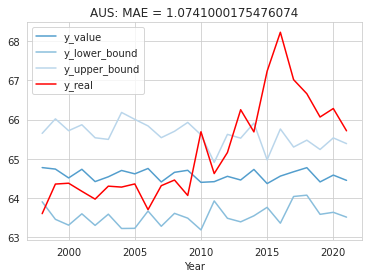

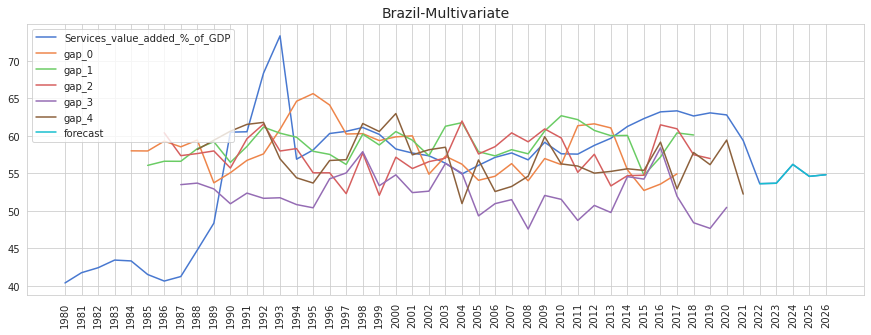

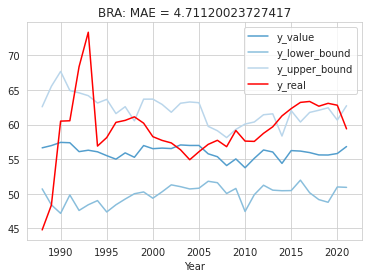

...

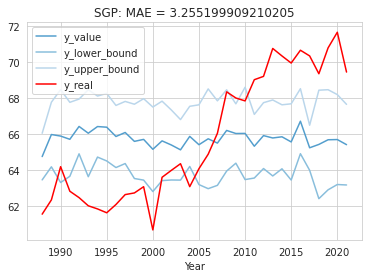

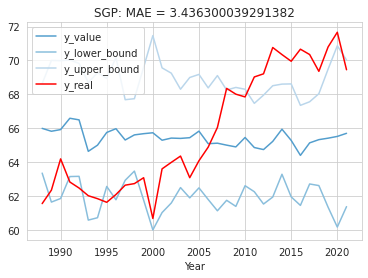

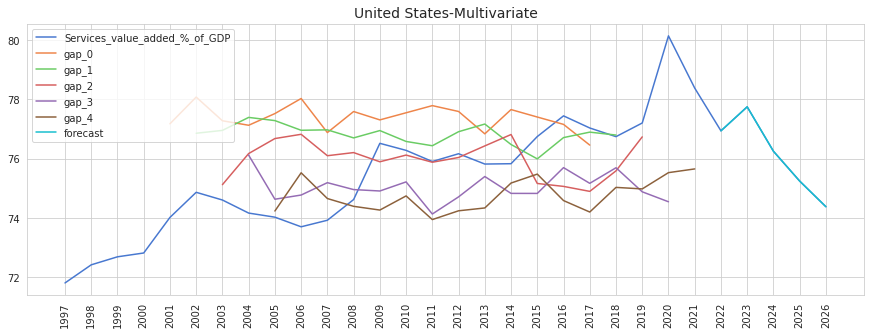

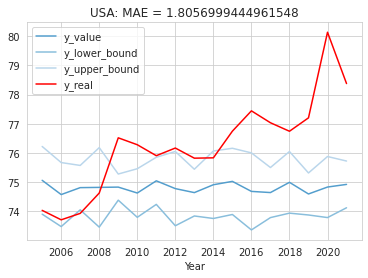

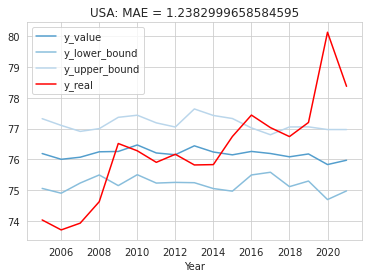

In [100]:
MAEs, RMSEs, MAPEs = [], [], []

for ckey in s_dfs.keys():
  country = dic_country[ckey]
  data = s_dfs[ckey]
  rbscaler = MRobustScaler() 
  scaled_data = rbscaler.transform(data, 0.1)
  train_df, val_df, test_df=train_test_split(scaled_data, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)

  fcst = forecast(rbscaler, scaled_data, model, args, IW=IW, name = 'Services_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Services_value_added_%_of_GDP']
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

###### Univariate

In [101]:
model_type = 'Univariate'

===== Training =====
Epoch [1/8], Train Loss: 735564.6562, Training Time (s): 0
Epoch [1/8], Val Loss: 735273.6250,  Validation time (s): 0
Epoch [2/8], Train Loss: 735276.1562, Training Time (s): 0
Epoch [2/8], Val Loss: 735318.1875,  Validation time (s): 0
Epoch [3/8], Train Loss: 735235.9688, Training Time (s): 0
Epoch [3/8], Val Loss: 734761.6250,  Validation time (s): 0
Epoch [4/8], Train Loss: 735366.6250, Training Time (s): 0
Epoch [4/8], Val Loss: 735092.5000,  Validation time (s): 0
Epoch [5/8], Train Loss: 734756.8125, Training Time (s): 0
Epoch [5/8], Val Loss: 734996.4375,  Validation time (s): 0
Epoch [6/8], Train Loss: 734696.6250, Training Time (s): 0
Epoch [6/8], Val Loss: 734558.1875,  Validation time (s): 0
Epoch [7/8], Train Loss: 734845.0625, Training Time (s): 0
Epoch [7/8], Val Loss: 734626.3750,  Validation time (s): 0
Epoch [8/8], Train Loss: 734679.4375, Training Time (s): 0
Epoch [8/8], Val Loss: 734423.7500,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.9129318, MAE2: 0.92619437
===== Training =====
Epoch [1/8], Train Loss: 735189.2500, Training Time (s): 0
Epoch [1/8], Val Loss: 735114.7500,  Validation time (s): 0
Epoch [2/8], Train Loss: 735349.0208, Training Time (s): 0
Epoch [2/8], Val Loss: 734746.2500,  Validation time (s): 0
Epoch [3/8], Train Loss: 735186.9167, Training Time (s): 0
Epoch [3/8], Val Loss: 735156.5625,  Validation time (s): 0
Epoch [4/8], Train Loss: 734765.3542, Training Time (s): 0
Epoch [4/8], Val Loss: 734694.9375,  Validation time (s): 0
Epoch [5/8], Train Loss: 734813.5417, Training Time (s): 0
Epoch [5/8], Val Loss: 734888.9688,  Validation time (s): 0
Epoch [6/8], Train Loss: 734744.6458, Training Time (s): 0
Epoch [6/8], Val Loss: 734307.3125,  Validation time (s): 0
Epoch [7/8], Train Loss: 734665.5833, Training Time (s): 0
Epoch [7/8], Val Loss: 734244.6562,  Validation time (s): 0
Epoch [8/8], Train Loss: 734337.1667, Training Time (s): 0
Epoch [8/8], Val Loss: 734545.1875,  Validation time 

<ipython-input-103-6489f135775b>:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735568.3542, Training Time (s): 0
Epoch [1/8], Val Loss: 734953.7188,  Validation time (s): 0
Epoch [2/8], Train Loss: 735374.1667, Training Time (s): 0
Epoch [2/8], Val Loss: 735246.5312,  Validation time (s): 0
Epoch [3/8], Train Loss: 734853.7292, Training Time (s): 0
Epoch [3/8], Val Loss: 734722.3750,  Validation time (s): 0
Epoch [4/8], Train Loss: 734708.2292, Training Time (s): 0
Epoch [4/8], Val Loss: 734801.5938,  Validation time (s): 0
Epoch [5/8], Train Loss: 734760.8958, Training Time (s): 0
Epoch [5/8], Val Loss: 734681.5000,  Validation time (s): 0
Epoch [6/8], Train Loss: 734841.6042, Training Time (s): 0
Epoch [6/8], Val Loss: 734981.1562,  Validation time (s): 0
Epoch [7/8], Train Loss: 734821.7083, Training Time (s): 0
Epoch [7/8], Val Loss: 734887.5312,  Validation time (s): 0
Epoch [8/8], Train Loss: 734320.7917, Training Time (s): 0
Epoch [8/8], Val Loss: 734218.0938,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 3.1247563, MAE2: 4.314498
===== Training =====
Epoch [1/8], Train Loss: 735390.6875, Training Time (s): 0
Epoch [1/8], Val Loss: 735636.8750,  Validation time (s): 0
Epoch [2/8], Train Loss: 735291.1875, Training Time (s): 0
Epoch [2/8], Val Loss: 734967.0000,  Validation time (s): 0
Epoch [3/8], Train Loss: 735101.0000, Training Time (s): 0
Epoch [3/8], Val Loss: 735088.4375,  Validation time (s): 0
Epoch [4/8], Train Loss: 735123.9375, Training Time (s): 0
Epoch [4/8], Val Loss: 734984.4375,  Validation time (s): 0
Epoch [5/8], Train Loss: 735083.6875, Training Time (s): 0
Epoch [5/8], Val Loss: 735407.6250,  Validation time (s): 0
Epoch [6/8], Train Loss: 734533.1875, Training Time (s): 0
Epoch [6/8], Val Loss: 735020.6875,  Validation time (s): 0
Epoch [7/8], Train Loss: 735011.9375, Training Time (s): 0
Epoch [7/8], Val Loss: 734832.9375,  Validation time (s): 0
Epoch [8/8], Train Loss: 735307.6250, Training Time (s): 0
Epoch [8/8], Val Loss: 734763.0000,  Validation time (s

<ipython-input-103-6489f135775b>:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 734983.1875, Training Time (s): 0
Epoch [1/8], Val Loss: 735100.3750,  Validation time (s): 0
Epoch [2/8], Train Loss: 735108.8750, Training Time (s): 0
Epoch [2/8], Val Loss: 734591.0000,  Validation time (s): 0
Epoch [3/8], Train Loss: 735360.8750, Training Time (s): 0
Epoch [3/8], Val Loss: 734410.0000,  Validation time (s): 0
Epoch [4/8], Train Loss: 735128.8750, Training Time (s): 0
Epoch [4/8], Val Loss: 735192.7500,  Validation time (s): 0
Epoch [5/8], Train Loss: 734880.3750, Training Time (s): 0
Epoch [5/8], Val Loss: 734530.6875,  Validation time (s): 0
Epoch [6/8], Train Loss: 734766.9375, Training Time (s): 0
Epoch [6/8], Val Loss: 735500.6875,  Validation time (s): 0
Epoch [7/8], Train Loss: 735122.0000, Training Time (s): 0
Epoch [7/8], Val Loss: 735250.7500,  Validation time (s): 0
Epoch [8/8], Train Loss: 734791.1875, Training Time (s): 0
Epoch [8/8], Val Loss: 734909.6875,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.2126132, MAE2: 1.4818789


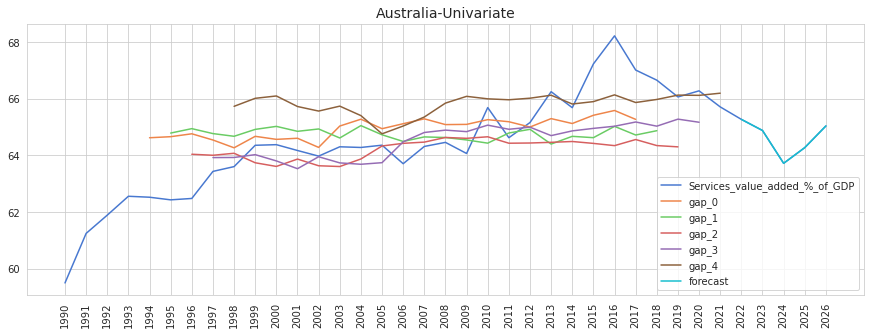

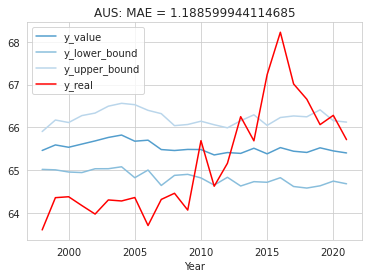

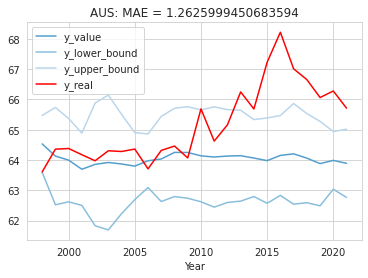

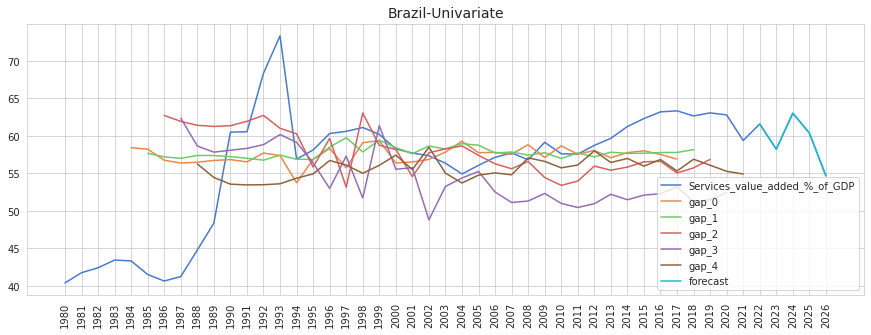

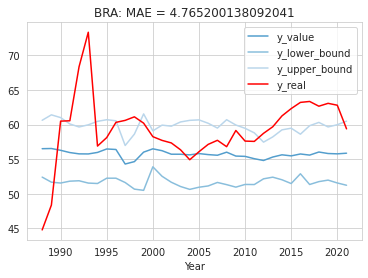

...

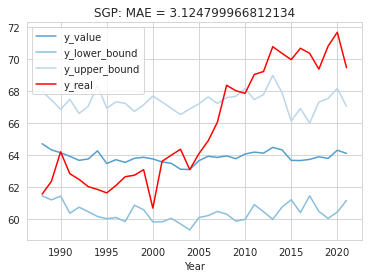

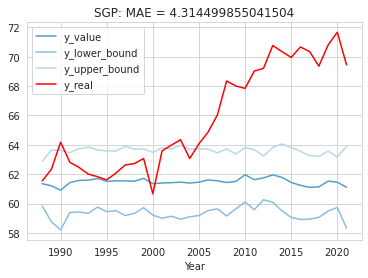

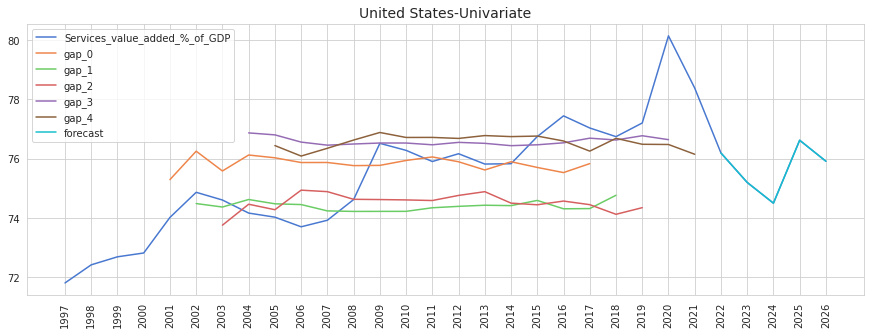

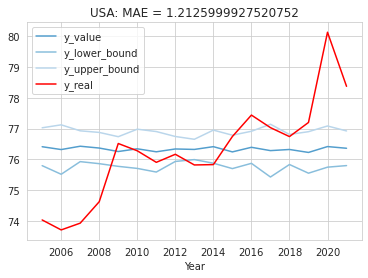

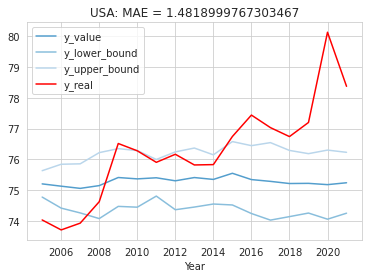

In [103]:
for ckey in s_dfs.keys():
  country = dic_country[ckey]
  data = s_dfs[ckey]
  data = data[['Services_value_added_%_of_GDP']]
  rbscaler = MRobustScaler() 
  scaled_data = rbscaler.transform(data, 0.1)
  train_df, val_df, test_df=train_test_split(scaled_data, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)

  fcst = forecast(rbscaler, scaled_data, model, args, IW=IW, name = 'Services_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Services_value_added_%_of_GDP']
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

In [104]:
rst = pd.DataFrame({
  'Country': [dic_country[c] for c in s_dfs.keys()]*2,
  'Type': ['Multivariate'] * 9 + ['Univariate'] * 9,
  'MAE': MAEs,
  'RMSE': RMSEs,
  'MAPE':MAPEs
              }).sort_values('Country').set_index('Country')
rst.to_csv(path_LSTM + f'{target_type}_result.csv')
rst

,Type,MAE,RMSE,MAPE
Country,,,,
Australia,Multivariate,1.0741328,1.4120564,0.01590691
Australia,Univariate,1.2626058,1.6842198,0.024957202
Brazil,Multivariate,3.8298295,5.4132915,0.10461484
Brazil,Univariate,5.3996644,6.4776983,0.11343302
Canada,Multivariate,2.011536,2.269649,0.025358384
Canada,Univariate,2.2652965,2.4919143,0.025261048
China,Multivariate,6.660773,8.239006,0.22973748
China,Univariate,6.6360836,8.349124,0.17419699
India,Multivariate,3.794425,4.1818376,0.10569357


### Add Fake Data: Monthly Data


- Add month (1, except the last 12)

- use 2 order polynomial to impute the missing months(11 month)

- only use the fake data to train and validate

- use the actual data to test, forecast and make plots

##### Little Example

In [20]:
  ckey = 'BRA'
  target_type = 'Manufacturing'

  
  country = dic_country[ckey]
  data = m_dfs[ckey]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

===== Training =====
Epoch [1/8], Train Loss: 735751.0208, Training Time (s): 0
Epoch [1/8], Val Loss: 735516.7812,  Validation time (s): 0
Epoch [2/8], Train Loss: 735629.0625, Training Time (s): 0
Epoch [2/8], Val Loss: 735664.3125,  Validation time (s): 0
Epoch [3/8], Train Loss: 735663.7292, Training Time (s): 0
Epoch [3/8], Val Loss: 735347.3750,  Validation time (s): 0
Epoch [4/8], Train Loss: 735365.5833, Training Time (s): 0
Epoch [4/8], Val Loss: 735080.1875,  Validation time (s): 0
Epoch [5/8], Train Loss: 734991.0000, Training Time (s): 0
Epoch [5/8], Val Loss: 735433.4375,  Validation time (s): 0
Epoch [6/8], Train Loss: 735008.4375, Training Time (s): 0
Epoch [6/8], Val Loss: 735213.4375,  Validation time (s): 0
Epoch [7/8], Train Loss: 735364.2708, Training Time (s): 0
Epoch [7/8], Val Loss: 735258.1562,  Validation time (s): 0
Epoch [8/8], Train Loss: 735408.7917, Training Time (s): 0
Epoch [8/8], Val Loss: 734637.2500,  Validation time (s): 0
===== Evaluation =====
MAE 

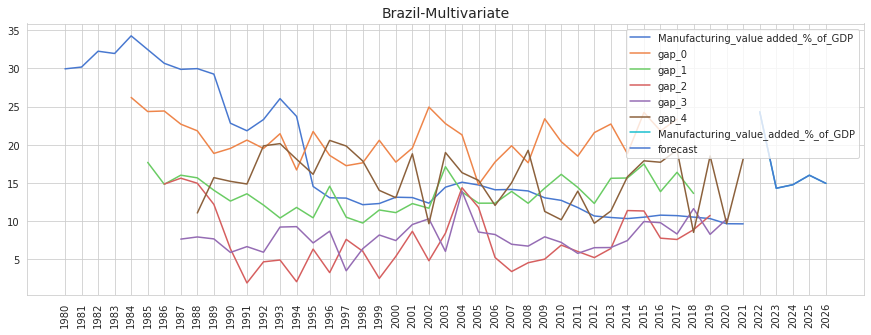

In [21]:
  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  # MAEs.append(str(round(min(MAE(y_pred, y_real)[0]), 2)) + '-' + str(round(max(MAE(y_pred, y_real)[0]),2)))
  # RMSEs.append(str(round(min(RMSE(y_pred, y_real)[0]), 2)) + '-' + str(round(max(RMSE(y_pred, y_real)[0]),2)))
  # MAPEs.append(str(round(min(MAPE(y_pred, y_real)), 2)) + '-' + str(round(max(MAPE(y_pred, y_real)),2)))
  yy = model(X.float())
  med, qrg = rbscaler.get_fitted()
  target_median, qrange = med.values[-1], qrg[-1]
  yy = yy.cpu().detach().numpy()*qrange+target_median
  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = 'Manufacturing_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Manufacturing_value_added_%_of_GDP']
  fcst.index = [i for i in range(2022, 2027)]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(yy, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}-month', bbox_inches='tight')

##### 1-Manufacturing

In [23]:
target_type = 'Manufacturing'

###### Multivariate

In [24]:
model_type = 'Multivariate'

===== Training =====
Epoch [1/30], Train Loss: 730287.0625, Training Time (s): 0
Epoch [1/30], Val Loss: 720202.5000,  Validation time (s): 0
Epoch [2/30], Train Loss: 716129.7500, Training Time (s): 0
Epoch [2/30], Val Loss: 708236.4375,  Validation time (s): 0
Epoch [3/30], Train Loss: 703832.2708, Training Time (s): 0
Epoch [3/30], Val Loss: 697377.5000,  Validation time (s): 0
Epoch [4/30], Train Loss: 694169.5000, Training Time (s): 0
Epoch [4/30], Val Loss: 688228.0938,  Validation time (s): 0
Epoch [5/30], Train Loss: 685445.1042, Training Time (s): 0
Epoch [5/30], Val Loss: 680142.0625,  Validation time (s): 0
Epoch [6/30], Train Loss: 677617.6875, Training Time (s): 0
Epoch [6/30], Val Loss: 672818.2500,  Validation time (s): 0
Epoch [7/30], Train Loss: 670554.2083, Training Time (s): 0
Epoch [7/30], Val Loss: 666845.5312,  Validation time (s): 0
Epoch [8/30], Train Loss: 664551.6250, Training Time (s): 0
Epoch [8/30], Val Loss: 660960.8125,  Validation time (s): 0
Epoch [9/30

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.8540329, MAE2: 0.79230917
===== Training =====
Epoch [1/30], Train Loss: 725430.5625, Training Time (s): 1
Epoch [1/30], Val Loss: 712236.0625,  Validation time (s): 0
Epoch [2/30], Train Loss: 704201.3500, Training Time (s): 1
Epoch [2/30], Val Loss: 693935.2500,  Validation time (s): 0
Epoch [3/30], Train Loss: 688180.3125, Training Time (s): 1
Epoch [3/30], Val Loss: 679926.2812,  Validation time (s): 0
Epoch [4/30], Train Loss: 675324.9000, Training Time (s): 1
Epoch [4/30], Val Loss: 669045.5000,  Validation time (s): 0
Epoch [5/30], Train Loss: 664903.0625, Training Time (s): 1
Epoch [5/30], Val Loss: 659711.6250,  Validation time (s): 0
Epoch [6/30], Train Loss: 656593.2250, Training Time (s): 1
Epoch [6/30], Val Loss: 652300.7188,  Validation time (s): 0
Epoch [7/30], Train Loss: 649585.0750, Training Time (s): 1
Epoch [7/30], Val Loss: 646056.4375,  Validation time (s): 0
Epoch [8/30], Train Loss: 643801.4000, Training Time (s): 1
Epoch [8/30], Val Loss: 640942.7500,  

<ipython-input-26-61087b1c0c95>:83: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/30], Train Loss: 725553.8375, Training Time (s): 1
Epoch [1/30], Val Loss: 711539.4375,  Validation time (s): 0
Epoch [2/30], Train Loss: 704352.4000, Training Time (s): 1
Epoch [2/30], Val Loss: 693941.8438,  Validation time (s): 0
Epoch [3/30], Train Loss: 688048.0625, Training Time (s): 1
Epoch [3/30], Val Loss: 679708.5625,  Validation time (s): 0
Epoch [4/30], Train Loss: 675130.6875, Training Time (s): 1
Epoch [4/30], Val Loss: 668909.5312,  Validation time (s): 0
Epoch [5/30], Train Loss: 664654.7250, Training Time (s): 1
Epoch [5/30], Val Loss: 659533.3125,  Validation time (s): 0
Epoch [6/30], Train Loss: 656404.0750, Training Time (s): 1
Epoch [6/30], Val Loss: 652188.1250,  Validation time (s): 0
Epoch [7/30], Train Loss: 649589.6750, Training Time (s): 1
Epoch [7/30], Val Loss: 646094.5938,  Validation time (s): 0
Epoch [8/30], Train Loss: 644051.3500, Training Time (s): 1
Epoch [8/30], Val Loss: 641385.1250,  Validation time (s): 0
Epoch [9/30

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 2.650764, MAE2: 2.5373685
===== Training =====
Epoch [1/30], Train Loss: 733498.3438, Training Time (s): 0
Epoch [1/30], Val Loss: 725146.1875,  Validation time (s): 0
Epoch [2/30], Train Loss: 722676.7188, Training Time (s): 0
Epoch [2/30], Val Loss: 715662.0000,  Validation time (s): 0
Epoch [3/30], Train Loss: 713665.5312, Training Time (s): 0
Epoch [3/30], Val Loss: 707425.6875,  Validation time (s): 0
Epoch [4/30], Train Loss: 705987.7188, Training Time (s): 0
Epoch [4/30], Val Loss: 700435.3750,  Validation time (s): 0
Epoch [5/30], Train Loss: 698641.7188, Training Time (s): 0
Epoch [5/30], Val Loss: 693448.1875,  Validation time (s): 0
Epoch [6/30], Train Loss: 692468.7500, Training Time (s): 0
Epoch [6/30], Val Loss: 688091.6250,  Validation time (s): 0
Epoch [7/30], Train Loss: 686374.3750, Training Time (s): 0
Epoch [7/30], Val Loss: 682576.3750,  Validation time (s): 0
Epoch [8/30], Train Loss: 681452.9062, Training Time (s): 0
Epoch [8/30], Val Loss: 677815.0000,  Va

<ipython-input-26-61087b1c0c95>:83: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/30], Train Loss: 733036.8438, Training Time (s): 0
Epoch [1/30], Val Loss: 725431.7500,  Validation time (s): 0
Epoch [2/30], Train Loss: 722530.2812, Training Time (s): 0
Epoch [2/30], Val Loss: 716340.6250,  Validation time (s): 0
Epoch [3/30], Train Loss: 713623.4375, Training Time (s): 0
Epoch [3/30], Val Loss: 707885.3750,  Validation time (s): 0
Epoch [4/30], Train Loss: 705752.6875, Training Time (s): 0
Epoch [4/30], Val Loss: 700290.6250,  Validation time (s): 0
Epoch [5/30], Train Loss: 698754.2812, Training Time (s): 0
Epoch [5/30], Val Loss: 694230.6250,  Validation time (s): 0
Epoch [6/30], Train Loss: 692323.4375, Training Time (s): 0
Epoch [6/30], Val Loss: 687155.5000,  Validation time (s): 0
Epoch [7/30], Train Loss: 686940.7812, Training Time (s): 0
Epoch [7/30], Val Loss: 682505.6250,  Validation time (s): 0
Epoch [8/30], Train Loss: 681395.6875, Training Time (s): 0
Epoch [8/30], Val Loss: 677336.5000,  Validation time (s): 0
Epoch [9/30

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.36604378, MAE2: 0.5201998


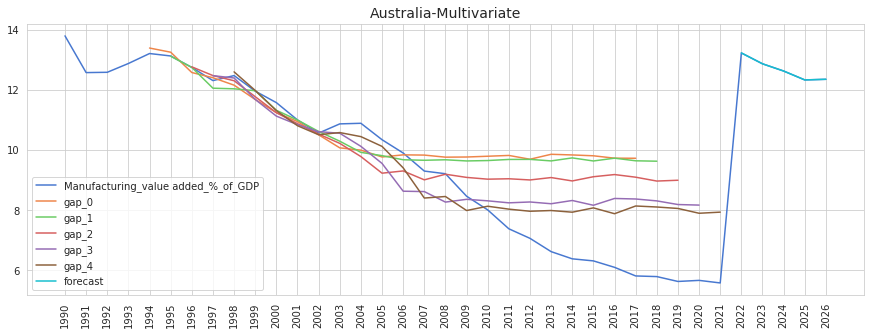

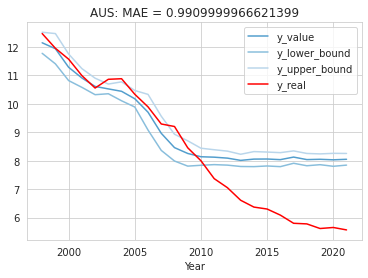

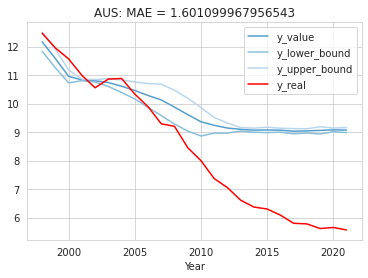

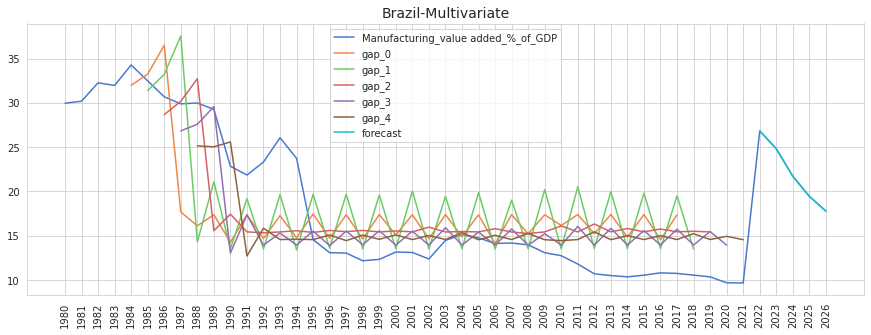

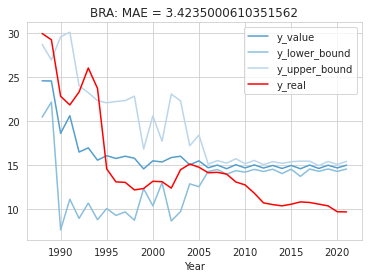

...

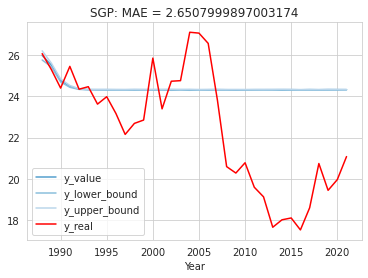

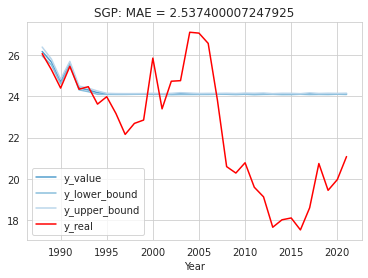

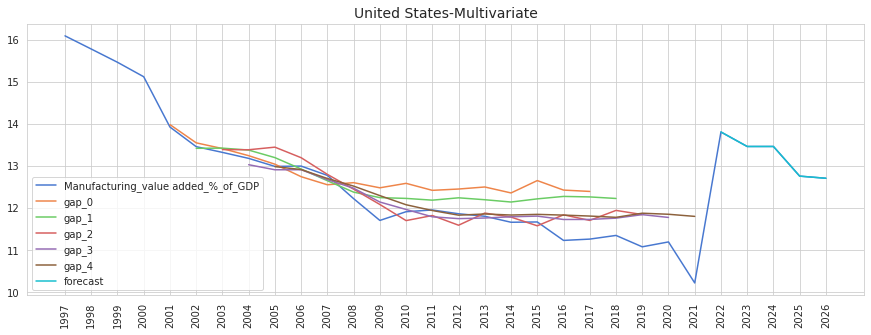

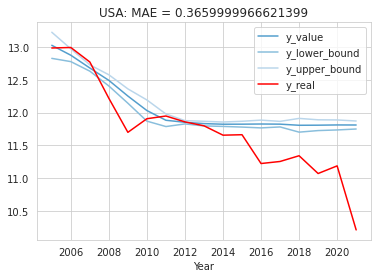

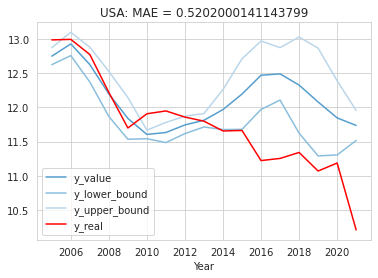

In [26]:
MAEs, RMSEs, MAPEs = [], [], []

for ckey in m_dfs.keys():
  country = dic_country[ckey]
  data = m_dfs[ckey]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  tmp.index = scaled_data1.index
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.05,
      "batch_size": 5,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.3,
      "epochs": 30,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)

  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = data.columns[-1])
  fcst['forecast'] = fcst[data.columns[-1]]
  fcst.index = [2022, 2023, 2024, 2025, 2026]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )

  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}-month', bbox_inches='tight')
  
  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg0, tmp,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg0, tmp,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

###### Univariate

In [27]:
model_type = 'Univariate'

===== Training =====
Epoch [1/8], Train Loss: 735429.3750, Training Time (s): 0
Epoch [1/8], Val Loss: 735238.4375,  Validation time (s): 0
Epoch [2/8], Train Loss: 735412.0312, Training Time (s): 0
Epoch [2/8], Val Loss: 735016.5000,  Validation time (s): 0
Epoch [3/8], Train Loss: 734902.5625, Training Time (s): 0
Epoch [3/8], Val Loss: 735245.8750,  Validation time (s): 0
Epoch [4/8], Train Loss: 734736.3125, Training Time (s): 0
Epoch [4/8], Val Loss: 734813.8750,  Validation time (s): 0
Epoch [5/8], Train Loss: 735131.2500, Training Time (s): 0
Epoch [5/8], Val Loss: 734904.1875,  Validation time (s): 0
Epoch [6/8], Train Loss: 735119.2500, Training Time (s): 0
Epoch [6/8], Val Loss: 734288.5000,  Validation time (s): 0
Epoch [7/8], Train Loss: 734708.6875, Training Time (s): 0
Epoch [7/8], Val Loss: 734323.5000,  Validation time (s): 0
Epoch [8/8], Train Loss: 734863.3125, Training Time (s): 0
Epoch [8/8], Val Loss: 735119.8750,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.624004, MAE2: 1.38832
===== Training =====
Epoch [1/8], Train Loss: 735655.1875, Training Time (s): 0
Epoch [1/8], Val Loss: 735270.1875,  Validation time (s): 0
Epoch [2/8], Train Loss: 735069.3125, Training Time (s): 0
Epoch [2/8], Val Loss: 735036.8125,  Validation time (s): 0
Epoch [3/8], Train Loss: 735060.0833, Training Time (s): 0
Epoch [3/8], Val Loss: 735199.5000,  Validation time (s): 0
Epoch [4/8], Train Loss: 734955.2708, Training Time (s): 0
Epoch [4/8], Val Loss: 734829.1875,  Validation time (s): 0
Epoch [5/8], Train Loss: 734934.8125, Training Time (s): 0
Epoch [5/8], Val Loss: 734585.2188,  Validation time (s): 0
Epoch [6/8], Train Loss: 734940.7708, Training Time (s): 0
Epoch [6/8], Val Loss: 734568.7500,  Validation time (s): 0
Epoch [7/8], Train Loss: 734726.2083, Training Time (s): 0
Epoch [7/8], Val Loss: 734558.3125,  Validation time (s): 0
Epoch [8/8], Train Loss: 734550.7083, Training Time (s): 0
Epoch [8/8], Val Loss: 734701.8750,  Validation time (s):

<ipython-input-28-b36ae14cc381>:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735579.8542, Training Time (s): 0
Epoch [1/8], Val Loss: 735530.3125,  Validation time (s): 0
Epoch [2/8], Train Loss: 735074.2917, Training Time (s): 0
Epoch [2/8], Val Loss: 735096.0625,  Validation time (s): 0
Epoch [3/8], Train Loss: 735260.6458, Training Time (s): 0
Epoch [3/8], Val Loss: 734530.0625,  Validation time (s): 0
Epoch [4/8], Train Loss: 735018.5625, Training Time (s): 0
Epoch [4/8], Val Loss: 735120.3750,  Validation time (s): 0
Epoch [5/8], Train Loss: 734805.7917, Training Time (s): 0
Epoch [5/8], Val Loss: 735039.0000,  Validation time (s): 0
Epoch [6/8], Train Loss: 734715.4583, Training Time (s): 0
Epoch [6/8], Val Loss: 734568.2188,  Validation time (s): 0
Epoch [7/8], Train Loss: 734540.5625, Training Time (s): 0
Epoch [7/8], Val Loss: 734617.5312,  Validation time (s): 0
Epoch [8/8], Train Loss: 734852.9167, Training Time (s): 0
Epoch [8/8], Val Loss: 734365.4062,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 2.8574393, MAE2: 2.559516
===== Training =====
Epoch [1/8], Train Loss: 735360.1875, Training Time (s): 0
Epoch [1/8], Val Loss: 735386.0000,  Validation time (s): 0
Epoch [2/8], Train Loss: 735633.5000, Training Time (s): 0
Epoch [2/8], Val Loss: 735725.1250,  Validation time (s): 0
Epoch [3/8], Train Loss: 735378.4375, Training Time (s): 0
Epoch [3/8], Val Loss: 735594.6875,  Validation time (s): 0
Epoch [4/8], Train Loss: 735210.1875, Training Time (s): 0
Epoch [4/8], Val Loss: 735214.8750,  Validation time (s): 0
Epoch [5/8], Train Loss: 735504.0000, Training Time (s): 0
Epoch [5/8], Val Loss: 734571.8750,  Validation time (s): 0
Epoch [6/8], Train Loss: 735216.1875, Training Time (s): 0
Epoch [6/8], Val Loss: 735350.8750,  Validation time (s): 0
Epoch [7/8], Train Loss: 734956.9375, Training Time (s): 0
Epoch [7/8], Val Loss: 735006.9375,  Validation time (s): 0
Epoch [8/8], Train Loss: 735396.8750, Training Time (s): 0
Epoch [8/8], Val Loss: 735146.7500,  Validation time (s

<ipython-input-28-b36ae14cc381>:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735645.6875, Training Time (s): 0
Epoch [1/8], Val Loss: 735579.6875,  Validation time (s): 0
Epoch [2/8], Train Loss: 735180.6250, Training Time (s): 0
Epoch [2/8], Val Loss: 735574.6875,  Validation time (s): 0
Epoch [3/8], Train Loss: 735492.9375, Training Time (s): 0
Epoch [3/8], Val Loss: 735460.8750,  Validation time (s): 0
Epoch [4/8], Train Loss: 735555.0000, Training Time (s): 0
Epoch [4/8], Val Loss: 735463.0000,  Validation time (s): 0
Epoch [5/8], Train Loss: 734678.7500, Training Time (s): 0
Epoch [5/8], Val Loss: 735014.1875,  Validation time (s): 0
Epoch [6/8], Train Loss: 735464.1250, Training Time (s): 0
Epoch [6/8], Val Loss: 735590.6250,  Validation time (s): 0
Epoch [7/8], Train Loss: 734639.2500, Training Time (s): 0
Epoch [7/8], Val Loss: 734955.5000,  Validation time (s): 0
Epoch [8/8], Train Loss: 734644.5000, Training Time (s): 0
Epoch [8/8], Val Loss: 735266.0000,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.9567599, MAE2: 0.73351854


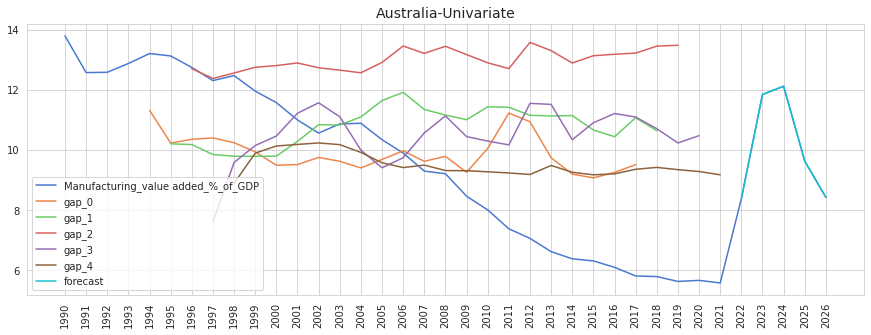

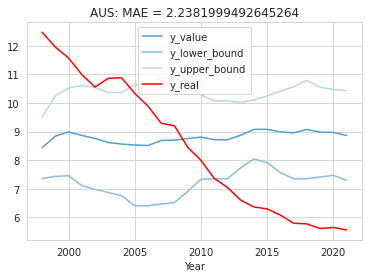

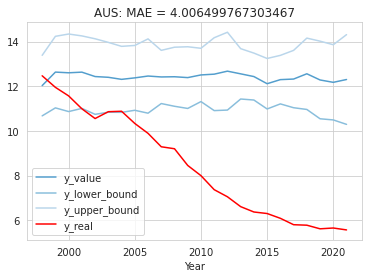

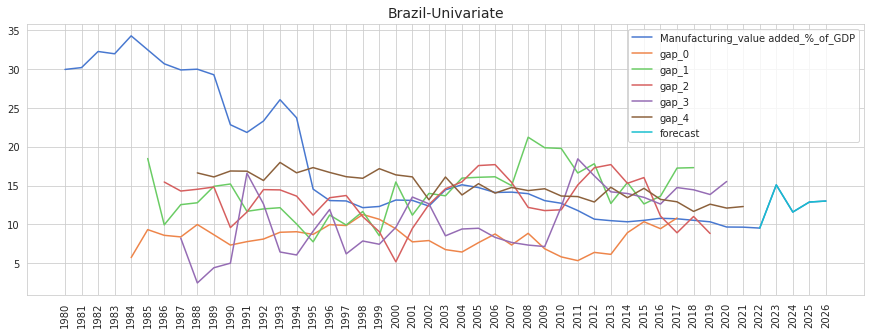

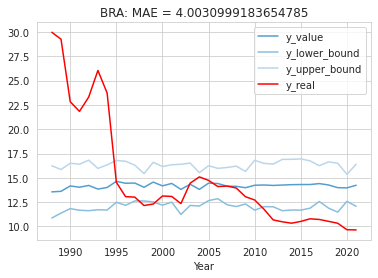

...

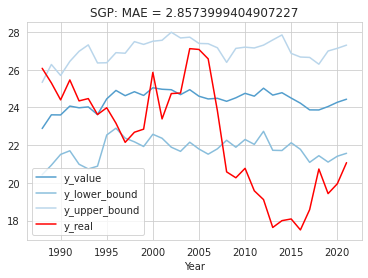

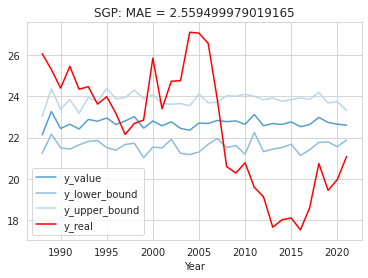

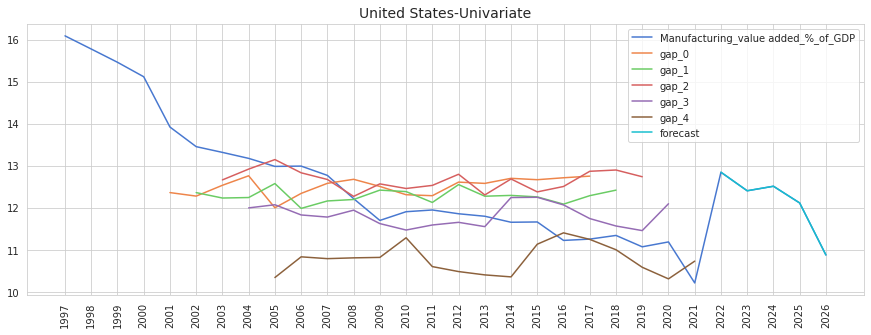

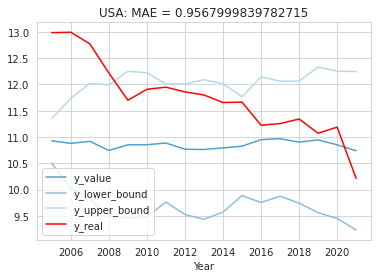

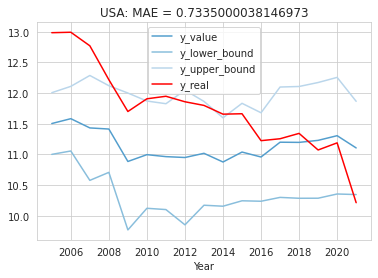

In [28]:
for ckey in m_dfs.keys():
  country = dic_country[ckey]
  data = m_dfs[ckey]
  data = data[['Manufacturing_value added_%_of_GDP']]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  tmp.index = scaled_data1.index
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 20,
      "dropout_probability": 0.3,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)

  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = data.columns[-1])
  fcst['forecast'] = fcst[data.columns[-1]]
  fcst.index = [2022, 2023, 2024, 2025, 2026]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}-month', bbox_inches='tight')
  
  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg0, tmp,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg0, tmp,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

In [29]:
rst_path = path_LSTM + args.experiment_name  + "/result/"
rst0 = pd.DataFrame({
  'Country': [dic_country[c] for c in m_dfs.keys()]*2,
  'Type': ['Multivariate'] * 9 + ['Univariate'] * 9,
  'MAE': MAEs,
  'RMSE': RMSEs,
  'MAPE':MAPEs
              }).sort_values('Country').set_index('Country')
rst0.to_csv(path_LSTM + f'{target_type}_monthly_result.csv')

rst0

,Type,MAE,RMSE,MAPE
Country,,,,
Australia,Multivariate,1.6011442,2.04406,0.21941268
Australia,Univariate,4.0064626,4.5796943,0.26843992
Brazil,Multivariate,3.5110323,4.782931,0.46129343
Brazil,Univariate,4.148545,6.7061114,0.40493426
Canada,Multivariate,0.60885555,1.1126195,0.10917882
Canada,Univariate,1.6666002,1.9369489,0.15767376
China,Multivariate,2.442799,2.8713808,0.0461155
China,Univariate,1.7704256,1.9556919,0.052826654
India,Multivariate,0.79515076,1.117993,0.034194395


##### 2-Service

In [30]:
SHIFT = 5
LW = 5
IW = 4
MAX_EPOCHS = 200
bs = 8
verbose = True
lr = 0.001
patience = 100

In [31]:
target_type = 'Service'

###### Multivariate

In [32]:
model_type = 'Multivariate'

===== Training =====
Epoch [1/8], Train Loss: 735571.3750, Training Time (s): 0
Epoch [1/8], Val Loss: 735531.5000,  Validation time (s): 0
Epoch [2/8], Train Loss: 736039.5312, Training Time (s): 0
Epoch [2/8], Val Loss: 736129.6250,  Validation time (s): 0
Epoch [3/8], Train Loss: 735413.0938, Training Time (s): 0
Epoch [3/8], Val Loss: 735641.0000,  Validation time (s): 0
Epoch [4/8], Train Loss: 735929.9688, Training Time (s): 0
Epoch [4/8], Val Loss: 735560.1875,  Validation time (s): 0
Epoch [5/8], Train Loss: 735233.1875, Training Time (s): 0
Epoch [5/8], Val Loss: 735117.0000,  Validation time (s): 0
Epoch [6/8], Train Loss: 735604.9375, Training Time (s): 0
Epoch [6/8], Val Loss: 735700.0000,  Validation time (s): 0
Epoch [7/8], Train Loss: 735239.6250, Training Time (s): 0
Epoch [7/8], Val Loss: 735479.4375,  Validation time (s): 0
Epoch [8/8], Train Loss: 735297.1875, Training Time (s): 0
Epoch [8/8], Val Loss: 735312.4375,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 2.1830935, MAE2: 1.8517452
===== Training =====
Epoch [1/8], Train Loss: 735927.5833, Training Time (s): 0
Epoch [1/8], Val Loss: 735889.9375,  Validation time (s): 0
Epoch [2/8], Train Loss: 735869.9167, Training Time (s): 0
Epoch [2/8], Val Loss: 735681.1250,  Validation time (s): 0
Epoch [3/8], Train Loss: 735501.1875, Training Time (s): 0
Epoch [3/8], Val Loss: 735499.8438,  Validation time (s): 0
Epoch [4/8], Train Loss: 735555.0833, Training Time (s): 0
Epoch [4/8], Val Loss: 735643.0938,  Validation time (s): 0
Epoch [5/8], Train Loss: 735398.2292, Training Time (s): 0
Epoch [5/8], Val Loss: 735022.2188,  Validation time (s): 0
Epoch [6/8], Train Loss: 735233.6667, Training Time (s): 0
Epoch [6/8], Val Loss: 734863.9062,  Validation time (s): 0
Epoch [7/8], Train Loss: 735039.5000, Training Time (s): 1
Epoch [7/8], Val Loss: 735440.8438,  Validation time (s): 0
Epoch [8/8], Train Loss: 735108.2083, Training Time (s): 1
Epoch [8/8], Val Loss: 734609.6875,  Validation time (

<ipython-input-33-00d7cb6fb57e>:82: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735520.0625, Training Time (s): 1
Epoch [1/8], Val Loss: 736078.7188,  Validation time (s): 0
Epoch [2/8], Train Loss: 735754.8750, Training Time (s): 0
Epoch [2/8], Val Loss: 735682.2500,  Validation time (s): 0
Epoch [3/8], Train Loss: 735435.3750, Training Time (s): 0
Epoch [3/8], Val Loss: 735429.5000,  Validation time (s): 0
Epoch [4/8], Train Loss: 735505.2500, Training Time (s): 0
Epoch [4/8], Val Loss: 735510.1875,  Validation time (s): 0
Epoch [5/8], Train Loss: 735485.4167, Training Time (s): 0
Epoch [5/8], Val Loss: 735292.7812,  Validation time (s): 0
Epoch [6/8], Train Loss: 735404.0208, Training Time (s): 0
Epoch [6/8], Val Loss: 735272.3750,  Validation time (s): 0
Epoch [7/8], Train Loss: 735151.4792, Training Time (s): 0
Epoch [7/8], Val Loss: 734841.2188,  Validation time (s): 0
Epoch [8/8], Train Loss: 735245.6875, Training Time (s): 0
Epoch [8/8], Val Loss: 734931.1250,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 4.0478215, MAE2: 3.5169032
===== Training =====
Epoch [1/8], Train Loss: 735558.8750, Training Time (s): 0
Epoch [1/8], Val Loss: 736321.2500,  Validation time (s): 0
Epoch [2/8], Train Loss: 736278.5000, Training Time (s): 0
Epoch [2/8], Val Loss: 735870.5000,  Validation time (s): 0
Epoch [3/8], Train Loss: 735956.5000, Training Time (s): 0
Epoch [3/8], Val Loss: 736113.6875,  Validation time (s): 0
Epoch [4/8], Train Loss: 735010.9375, Training Time (s): 0
Epoch [4/8], Val Loss: 736177.6875,  Validation time (s): 0
Epoch [5/8], Train Loss: 735802.1875, Training Time (s): 0
Epoch [5/8], Val Loss: 735707.1250,  Validation time (s): 0
Epoch [6/8], Train Loss: 735799.3750, Training Time (s): 0
Epoch [6/8], Val Loss: 735862.6875,  Validation time (s): 0
Epoch [7/8], Train Loss: 736069.8750, Training Time (s): 0
Epoch [7/8], Val Loss: 735430.8750,  Validation time (s): 0
Epoch [8/8], Train Loss: 735809.2500, Training Time (s): 0
Epoch [8/8], Val Loss: 735590.6250,  Validation time (

<ipython-input-33-00d7cb6fb57e>:82: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 736116.9375, Training Time (s): 0
Epoch [1/8], Val Loss: 736203.3750,  Validation time (s): 0
Epoch [2/8], Train Loss: 736265.1875, Training Time (s): 0
Epoch [2/8], Val Loss: 735498.5000,  Validation time (s): 0
Epoch [3/8], Train Loss: 735543.6250, Training Time (s): 0
Epoch [3/8], Val Loss: 735812.0000,  Validation time (s): 0
Epoch [4/8], Train Loss: 735915.5000, Training Time (s): 0
Epoch [4/8], Val Loss: 735695.5000,  Validation time (s): 0
Epoch [5/8], Train Loss: 735469.4375, Training Time (s): 0
Epoch [5/8], Val Loss: 735959.4375,  Validation time (s): 0
Epoch [6/8], Train Loss: 736149.1250, Training Time (s): 0
Epoch [6/8], Val Loss: 735470.0000,  Validation time (s): 0
Epoch [7/8], Train Loss: 735855.0000, Training Time (s): 0
Epoch [7/8], Val Loss: 735342.9375,  Validation time (s): 0
Epoch [8/8], Train Loss: 735690.5000, Training Time (s): 0
Epoch [8/8], Val Loss: 735450.8750,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.1525058, MAE2: 1.1988871


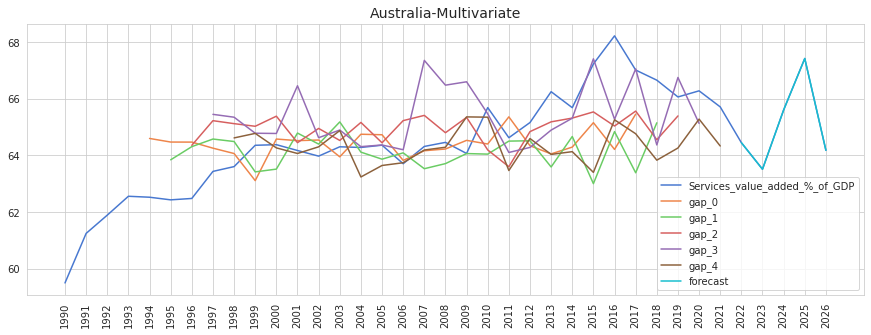

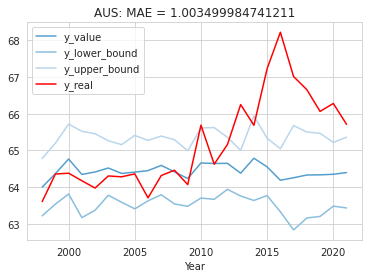

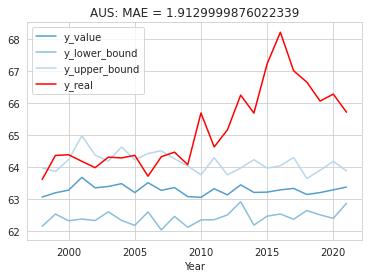

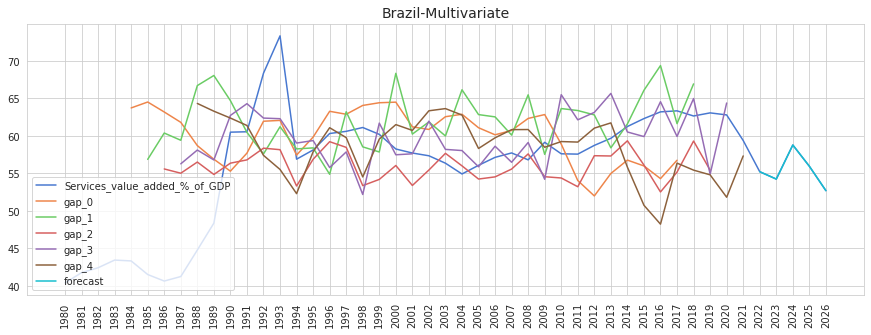

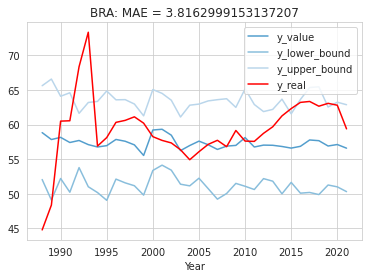

...

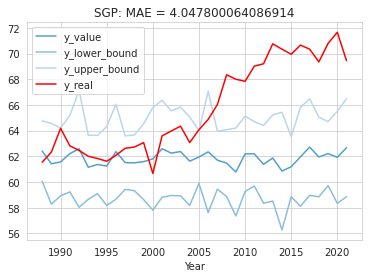

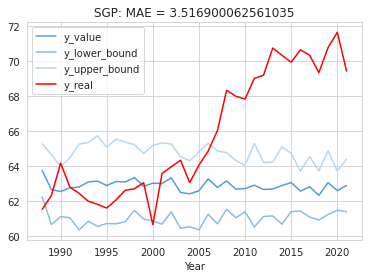

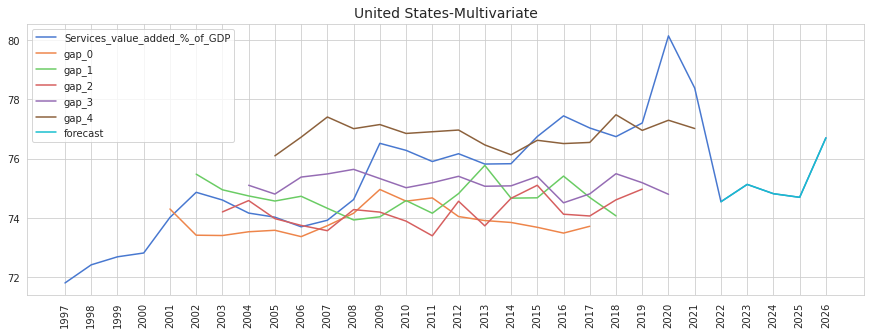

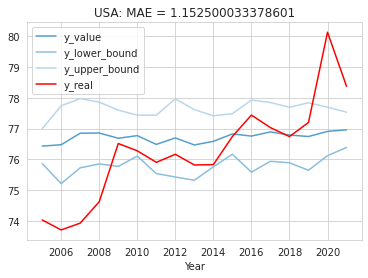

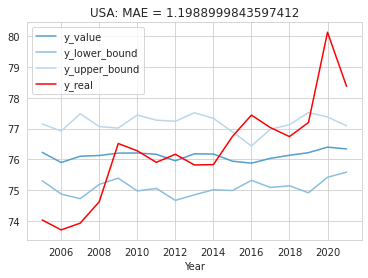

In [33]:
MAEs, RMSEs, MAPEs = [], [], []

for ckey in s_dfs.keys():
  country = dic_country[ckey]
  data = s_dfs[ckey]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  tmp.index = scaled_data1.index
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)

  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = data.columns[-1])
  fcst['forecast'] = fcst[data.columns[-1]]
  fcst.index = [2022, 2023, 2024, 2025, 2026]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}-month', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg0, tmp,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg0, tmp,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

###### Univariate

In [34]:
model_type = 'Univariate'

===== Training =====
Epoch [1/8], Train Loss: 735272.6875, Training Time (s): 0
Epoch [1/8], Val Loss: 735435.8750,  Validation time (s): 0
Epoch [2/8], Train Loss: 735224.2812, Training Time (s): 0
Epoch [2/8], Val Loss: 735152.0000,  Validation time (s): 0
Epoch [3/8], Train Loss: 735027.0000, Training Time (s): 0
Epoch [3/8], Val Loss: 735615.0000,  Validation time (s): 0
Epoch [4/8], Train Loss: 734804.5625, Training Time (s): 0
Epoch [4/8], Val Loss: 735430.0000,  Validation time (s): 0
Epoch [5/8], Train Loss: 734789.9688, Training Time (s): 0
Epoch [5/8], Val Loss: 734640.6250,  Validation time (s): 0
Epoch [6/8], Train Loss: 735256.3438, Training Time (s): 0
Epoch [6/8], Val Loss: 734747.6875,  Validation time (s): 0
Epoch [7/8], Train Loss: 735236.7812, Training Time (s): 0
Epoch [7/8], Val Loss: 735103.3750,  Validation time (s): 0
Epoch [8/8], Train Loss: 734954.6562, Training Time (s): 0
Epoch [8/8], Val Loss: 734913.1875,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.5035026, MAE2: 1.0075309
===== Training =====
Epoch [1/8], Train Loss: 735165.6667, Training Time (s): 0
Epoch [1/8], Val Loss: 735487.2812,  Validation time (s): 0
Epoch [2/8], Train Loss: 735092.1250, Training Time (s): 0
Epoch [2/8], Val Loss: 734967.5000,  Validation time (s): 0
Epoch [3/8], Train Loss: 734971.9792, Training Time (s): 0
Epoch [3/8], Val Loss: 735348.8438,  Validation time (s): 0
Epoch [4/8], Train Loss: 734828.9167, Training Time (s): 0
Epoch [4/8], Val Loss: 735144.3125,  Validation time (s): 0
Epoch [5/8], Train Loss: 734740.3333, Training Time (s): 0
Epoch [5/8], Val Loss: 734763.0625,  Validation time (s): 0
Epoch [6/8], Train Loss: 734618.4792, Training Time (s): 0
Epoch [6/8], Val Loss: 734733.1562,  Validation time (s): 0
Epoch [7/8], Train Loss: 734704.2500, Training Time (s): 0
Epoch [7/8], Val Loss: 734565.2812,  Validation time (s): 0
Epoch [8/8], Train Loss: 734818.3958, Training Time (s): 0
Epoch [8/8], Val Loss: 734569.2500,  Validation time (

<ipython-input-35-45c344f9c417>:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735865.3542, Training Time (s): 0
Epoch [1/8], Val Loss: 735322.5625,  Validation time (s): 0
Epoch [2/8], Train Loss: 735367.5833, Training Time (s): 0
Epoch [2/8], Val Loss: 734825.1875,  Validation time (s): 0
Epoch [3/8], Train Loss: 735029.0625, Training Time (s): 0
Epoch [3/8], Val Loss: 734978.5625,  Validation time (s): 0
Epoch [4/8], Train Loss: 734996.6042, Training Time (s): 0
Epoch [4/8], Val Loss: 735012.8438,  Validation time (s): 0
Epoch [5/8], Train Loss: 734893.3333, Training Time (s): 0
Epoch [5/8], Val Loss: 734761.3125,  Validation time (s): 0
Epoch [6/8], Train Loss: 734532.2292, Training Time (s): 0
Epoch [6/8], Val Loss: 734362.6875,  Validation time (s): 0
Epoch [7/8], Train Loss: 734572.6458, Training Time (s): 0
Epoch [7/8], Val Loss: 734801.0938,  Validation time (s): 0
Epoch [8/8], Train Loss: 734689.8333, Training Time (s): 0
Epoch [8/8], Val Loss: 734774.9375,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 3.0224748, MAE2: 3.389593
===== Training =====
Epoch [1/8], Train Loss: 735577.5000, Training Time (s): 0
Epoch [1/8], Val Loss: 735478.3750,  Validation time (s): 0
Epoch [2/8], Train Loss: 735295.3750, Training Time (s): 0
Epoch [2/8], Val Loss: 735588.6875,  Validation time (s): 0
Epoch [3/8], Train Loss: 735537.1875, Training Time (s): 0
Epoch [3/8], Val Loss: 735407.1250,  Validation time (s): 0
Epoch [4/8], Train Loss: 735426.6875, Training Time (s): 0
Epoch [4/8], Val Loss: 735573.9375,  Validation time (s): 0
Epoch [5/8], Train Loss: 735800.8750, Training Time (s): 0
Epoch [5/8], Val Loss: 735233.7500,  Validation time (s): 0
Epoch [6/8], Train Loss: 734689.5000, Training Time (s): 0
Epoch [6/8], Val Loss: 735401.5000,  Validation time (s): 0
Epoch [7/8], Train Loss: 734521.4375, Training Time (s): 0
Epoch [7/8], Val Loss: 735257.1875,  Validation time (s): 0
Epoch [8/8], Train Loss: 735224.8750, Training Time (s): 0
Epoch [8/8], Val Loss: 735132.1250,  Validation time (s

<ipython-input-35-45c344f9c417>:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 5))
/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 735665.6875, Training Time (s): 0
Epoch [1/8], Val Loss: 735569.1250,  Validation time (s): 0
Epoch [2/8], Train Loss: 734829.3750, Training Time (s): 0
Epoch [2/8], Val Loss: 735257.7500,  Validation time (s): 0
Epoch [3/8], Train Loss: 735848.4375, Training Time (s): 0
Epoch [3/8], Val Loss: 735525.4375,  Validation time (s): 0
Epoch [4/8], Train Loss: 734780.6250, Training Time (s): 0
Epoch [4/8], Val Loss: 735222.1250,  Validation time (s): 0
Epoch [5/8], Train Loss: 735055.0000, Training Time (s): 0
Epoch [5/8], Val Loss: 735046.1875,  Validation time (s): 0
Epoch [6/8], Train Loss: 735360.8750, Training Time (s): 0
Epoch [6/8], Val Loss: 735547.2500,  Validation time (s): 0
Epoch [7/8], Train Loss: 735341.1875, Training Time (s): 0
Epoch [7/8], Val Loss: 735292.5000,  Validation time (s): 0
Epoch [8/8], Train Loss: 735263.8750, Training Time (s): 0
Epoch [8/8], Val Loss: 734935.3750,  Validation time (s): 0
===== Evaluation =====
MAE 

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.7940302, MAE2: 1.1781517


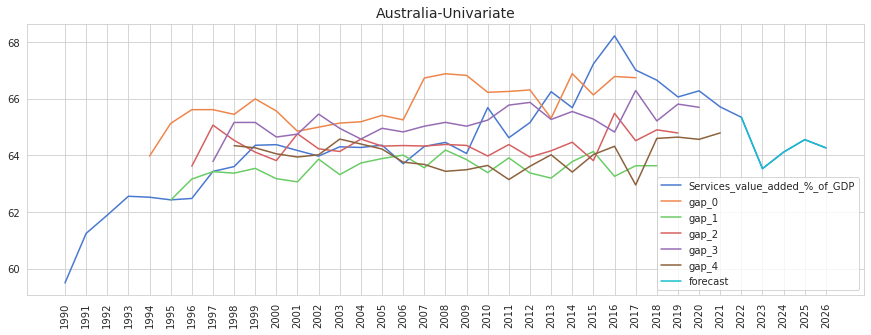

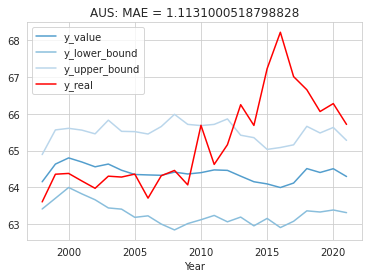

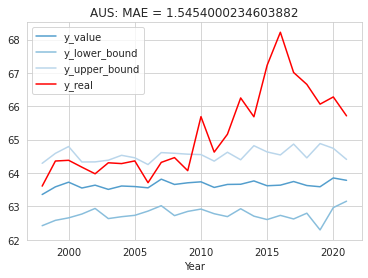

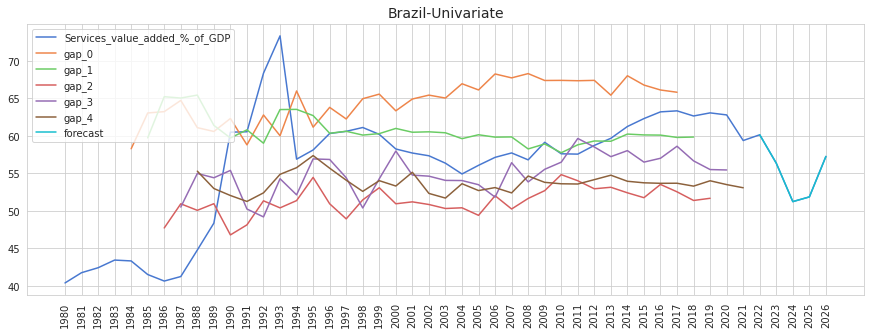

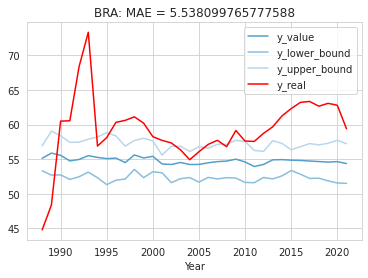

...

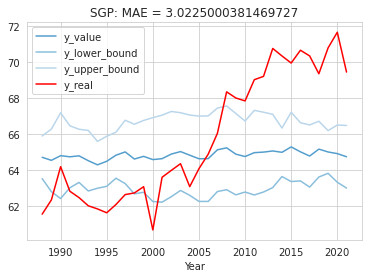

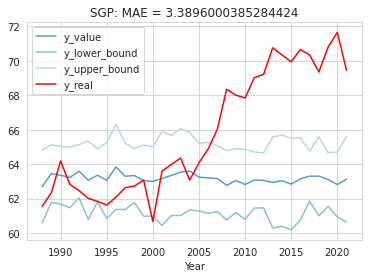

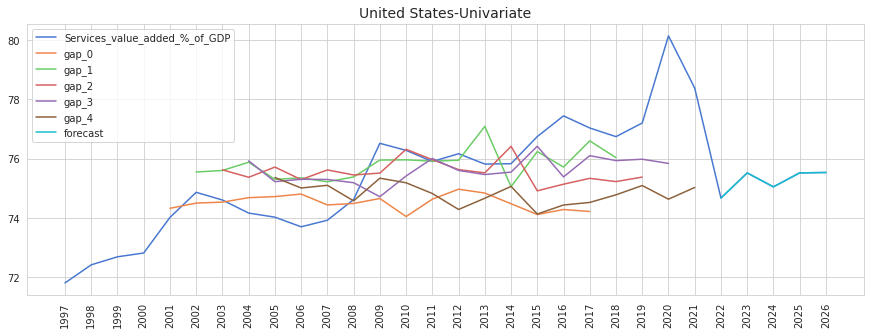

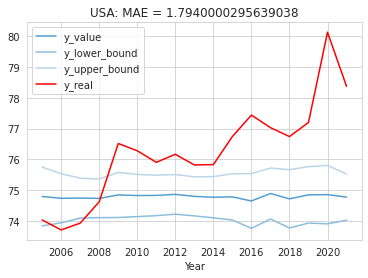

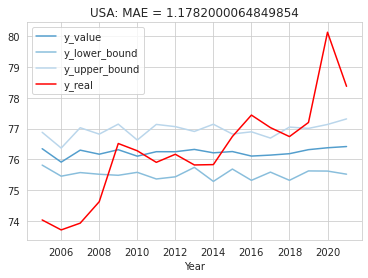

In [35]:
for ckey in s_dfs.keys():
  country = dic_country[ckey]
  data = s_dfs[ckey]
  data = data[['Services_value_added_%_of_GDP']]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  tmp.index = scaled_data1.index
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)

  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = data.columns[-1])
  fcst['forecast'] = fcst[data.columns[-1]]
  fcst.index = [2022, 2023, 2024, 2025, 2026]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}-month', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg0, tmp,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg0, tmp,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

In [ ]:
rst = pd.DataFrame({
  'Country': [dic_country[c] for c in s_dfs.keys()]*2,
  'Type': ['Multivariate'] * 9 + ['Univariate'] * 9,
  'MAE': MAEs,
  'RMSE': RMSEs,
  'MAPE':MAPEs
              }).sort_values('Country').set_index('Country')
rst.to_csv(path_LSTM + f'{target_type}_monthly_result.csv')

rst

,Type,MAE,RMSE,MAPE
Country,,,,
Australia,Multivariate,1.9129978,2.292278,0.022149073
Australia,Univariate,1.5453973,1.9548461,0.019639593
Brazil,Multivariate,3.577341,5.2502213,0.09528096
Brazil,Univariate,4.468337,5.782536,0.10167181
Canada,Multivariate,2.2772868,2.6264982,0.025884317
Canada,Univariate,2.38536,2.7354364,0.023510551
China,Multivariate,7.3092365,8.35876,0.15878832
China,Univariate,6.853048,8.360949,0.14632818
India,Multivariate,3.827654,4.4385533,0.11358105
